![](https://www.dii.uchile.cl/wp-content/uploads/2021/06/Magi%CC%81ster-en-Ciencia-de-Datos.png)


# Introducción

## Descripción del Problema
El objetivo principal de este proyecto es predecir la probabilidad de morosidad de billeteras en un sistema financiero basado en blockchain. Identificar las billeteras con mayor riesgo de incumplimiento es crucial para implementar estrategias de mitigación efectivas y mejorar la estabilidad del sistema.

## Resumen de los Datos
El conjunto de datos contiene información detallada sobre las transacciones y comportamientos de las billeteras. Las características incluyen variables como el tiempo de vida de la billetera, factores de riesgo acumulados, métricas de transacciones (entrantes, salientes y riesgosas), y datos de mercado asociados. Debido a la naturaleza del problema, el conjunto de datos está desbalanceado, con una mayoría de billeteras no morosas y una minoría de morosas.

## Métrica de Evaluación
Dado el desbalance en los datos, se seleccionó el **AUC-PR** (Área Bajo la Curva de Precisión-Recall) como métrica principal. Esta métrica es adecuada porque se centra en la capacidad del modelo para identificar correctamente las clases positivas, incluso cuando son escasas. Además, se evaluaron métricas complementarias como **precision**, **recall** y **f1-score**, enfocándonos en la clase de billeteras morosas.

## Modelos Empleados y Transformaciones
Se probaron varios modelos de clasificación, incluyendo **Random Forest**, **LightGBM**, **XGBoost**, y un modelo de red neuronal (MLP). Las transformaciones de datos incluyeron:
- Preprocesamiento con un pipeline que integró normalización, generación de características adicionales (como clusters) y reducción de dimensionalidad mediante PCA.
- Manejo de valores atípicos y discretización de variables numéricas.

El modelo final, un **Random Forest**, fue seleccionado por su capacidad para manejar datos tabulares complejos y su desempeño superior en las métricas evaluadas.

## Análisis General de Resultados
El modelo final alcanzó un **AUC-PR** de 0.96, superando significativamente a los otros modelos probados. Este desempeño demuestra que el modelo cumple con el objetivo planteado de identificar billeteras morosas con alta precisión y recall. Comparado con los resultados de otros equipos, nuestro enfoque logró un equilibrio óptimo entre las métricas clave, destacándose en escenarios con datos desbalanceados.



In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns


import warnings

# Ignorar warnings
warnings.filterwarnings("ignore")

# Configurar pandas para mostrar todas las filas
pd.set_option('display.max_rows', 30)  # None significa sin límite

# Opcional: Configurar también el ancho de las columnas
pd.set_option('display.max_columns', 50)  # Mostrar todas las columnas
pd.set_option('display.width', 1000)  # Ajustar el ancho de la salida

In [9]:
X = pd.read_parquet("../data/raw/X_t0.parquet")
y = pd.read_parquet("../data/raw/y_t0.parquet")
df = pd.concat([X, y], axis=1)
df.head()

,borrow_block_number,borrow_timestamp,wallet_address,first_tx_timestamp,last_tx_timestamp,wallet_age,incoming_tx_count,outgoing_tx_count,net_incoming_tx_count,total_gas_paid_eth,...,market_max_drawdown_365d,market_natr,market_plus_di,market_plus_dm,market_ppo,market_rocp,market_rocr,unique_borrow_protocol_count,unique_lending_protocol_count,target
0,7711117,1.557197e+09,0x502cb8985b2c92a8d4bf309cdaa89de9be442708,1.537224e+09,1.557197e+09,19973049.0,199,438,-239,0.397391,...,-0.895911,4.479356,33.216622,33.415526,-2.370346,0.104294,1.104294,0,1,1
1,7711123,1.557197e+09,0x502cb8985b2c92a8d4bf309cdaa89de9be442708,1.537224e+09,1.557197e+09,19973188.0,200,439,-239,0.399063,...,-0.895911,4.479356,33.216622,33.415526,-2.370346,0.104294,1.104294,1,1,1
2,7711126,1.557197e+09,0x502cb8985b2c92a8d4bf309cdaa89de9be442708,1.537224e+09,1.557197e+09,19973238.0,201,440,-239,0.400895,...,-0.895911,4.479356,33.216622,33.415526,-2.370346,0.104294,1.104294,1,1,1
3,7711672,1.557205e+09,0xa7ff0d561cd15ed525e31bbe0af3fe34ac2059f6,1.557191e+09,1.557198e+09,13922.0,8,56,-48,0.604001,...,-0.895911,4.479356,33.216622,33.415526,-2.370346,0.104294,1.104294,0,1,0
4,7712572,1.557217e+09,0xbd9ed130a53cfafcf81502e4d35329a6c4d53410,1.557217e+09,1.557217e+09,264.0,2,3,-1,0.003008,...,-0.895911,4.479356,33.216622,33.415526,-2.370346,0.104294,1.104294,0,1,0


In [11]:
# Datos para probar interfaz con gradio mas adelante
df.iloc[[1000,5000,35000]].to_csv("../predecir.csv", index=False)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44296 entries, 0 to 44295
Data columns (total 78 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   borrow_block_number                      44296 non-null  int64  
 1   borrow_timestamp                         44296 non-null  float64
 2   wallet_address                           44296 non-null  object 
 3   first_tx_timestamp                       44296 non-null  float64
 4   last_tx_timestamp                        44296 non-null  float64
 5   wallet_age                               44296 non-null  float64
 6   incoming_tx_count                        44296 non-null  int64  
 7   outgoing_tx_count                        44296 non-null  int64  
 8   net_incoming_tx_count                    44296 non-null  int64  
 9   total_gas_paid_eth                       44296 non-null  float64
 10  avg_gas_paid_per_tx_eth                  44296

> No existen valores nulos

In [5]:
Q_wallets = X["wallet_address"].nunique()

print(f"Existen {Q_wallets} wallets unicas")

Existen 6788 wallets unicas


In [6]:
print(df['first_tx_timestamp'].unique())


[1.53722426e+09 1.55719101e+09 1.55721694e+09 ... 1.59275883e+09
 1.48803307e+09 1.59310870e+09]


In [3]:
# Seleccionar columnas con timestamps
timestamp_columns = [
    'borrow_timestamp',
    'first_tx_timestamp',
    'last_tx_timestamp',
    'risky_first_tx_timestamp',
    'risky_last_tx_timestamp'
]

# Convertir a formato datetime
for col in timestamp_columns:
    df[col] = pd.to_datetime(df[col], errors='coerce', unit='s')  # Maneja valores no válidos con 'coerce'


In [4]:
df['wallet_age_hours'] = (df['last_tx_timestamp'] - df['first_tx_timestamp']).dt.total_seconds() / 360

df.head()

,borrow_block_number,borrow_timestamp,wallet_address,first_tx_timestamp,last_tx_timestamp,wallet_age,incoming_tx_count,outgoing_tx_count,net_incoming_tx_count,total_gas_paid_eth,avg_gas_paid_per_tx_eth,risky_tx_count,risky_unique_contract_count,risky_first_tx_timestamp,risky_last_tx_timestamp,risky_first_last_tx_timestamp_diff,risky_sum_outgoing_amount_eth,outgoing_tx_sum_eth,incoming_tx_sum_eth,outgoing_tx_avg_eth,incoming_tx_avg_eth,max_eth_ever,min_eth_ever,total_balance_eth,risk_factor,...,market_cci,market_cmo,market_correl,market_dx,market_fastk,market_fastd,market_ht_trendmode,market_linearreg_slope,market_macd_macdext,market_macd_macdfix,market_macd,market_macdsignal_macdext,market_macdsignal_macdfix,market_macdsignal,market_max_drawdown_365d,market_natr,market_plus_di,market_plus_dm,market_ppo,market_rocp,market_rocr,unique_borrow_protocol_count,unique_lending_protocol_count,target,wallet_age_hours
0,7711117,2019-05-07 02:48:28,0x502cb8985b2c92a8d4bf309cdaa89de9be442708,2018-09-17 22:44:19,2019-05-07 02:44:34,19973049.0,199,438,-239,0.397391,0.000981,0,0,2001-09-09 01:46:39,2001-09-09 01:46:39,0,0.0,975.686105,958.353127,1.174111,1.153253,61.680231,0.060948,58.317987,0.000001,...,111.965749,19.928594,0.878363,31.02392,80.653832,57.459322,1,0.423859,-3.914837,1.326453,1.406507,-3.468973,1.163425,1.212219,-0.895911,4.479356,33.216622,33.415526,-2.370346,0.104294,1.104294,0,1,1,55480.041667
1,7711123,2019-05-07 02:50:47,0x502cb8985b2c92a8d4bf309cdaa89de9be442708,2018-09-17 22:44:19,2019-05-07 02:48:28,19973188.0,200,439,-239,0.399063,0.000983,0,0,2001-09-09 01:46:39,2001-09-09 01:46:39,0,0.0,975.686105,958.510238,1.171292,1.150673,61.680231,0.060948,58.317987,0.004953,...,111.965749,19.928594,0.878363,31.02392,80.653832,57.459322,1,0.423859,-3.914837,1.326453,1.406507,-3.468973,1.163425,1.212219,-0.895911,4.479356,33.216622,33.415526,-2.370346,0.104294,1.104294,1,1,1,55480.691667
2,7711126,2019-05-07 02:51:37,0x502cb8985b2c92a8d4bf309cdaa89de9be442708,2018-09-17 22:44:19,2019-05-07 02:50:47,19973238.0,201,440,-239,0.400895,0.000985,0,0,2001-09-09 01:46:39,2001-09-09 01:46:39,0,0.0,975.686105,958.896402,1.168486,1.148379,61.680231,0.060948,58.317987,0.017103,...,111.965749,19.928594,0.878363,31.02392,80.653832,57.459322,1,0.423859,-3.914837,1.326453,1.406507,-3.468973,1.163425,1.212219,-0.895911,4.479356,33.216622,33.415526,-2.370346,0.104294,1.104294,1,1,1,55481.077778
3,7711672,2019-05-07 04:55:33,0xa7ff0d561cd15ed525e31bbe0af3fe34ac2059f6,2019-05-07 01:03:31,2019-05-07 02:52:25,13922.0,8,56,-48,0.604001,0.010786,0,0,2001-09-09 01:46:39,2001-09-09 01:46:39,0,0.0,0.103772,0.803077,0.001596,0.012355,0.000000,0.000000,0.000000,0.000001,...,111.965749,19.928594,0.878363,31.02392,80.653832,57.459322,1,0.423859,-3.914837,1.326453,1.406507,-3.468973,1.163425,1.212219,-0.895911,4.479356,33.216622,33.415526,-2.370346,0.104294,1.104294,0,1,0,18.150000
4,7712572,2019-05-07 08:20:08,0xbd9ed130a53cfafcf81502e4d35329a6c4d53410,2019-05-07 08:15:44,2019-05-07 08:19:14,264.0,2,3,-1,0.003008,0.001003,0,0,2001-09-09 01:46:39,2001-09-09 01:46:39,0,0.0,0.010000,0.050000,0.002000,0.010000,0.000000,0.000000,0.000000,0.000001,...,111.965749,19.928594,0.878363,31.02392,80.653832,57.459322,1,0.423859,-3.914837,1.326453,1.406507,-3.468973,1.163425,1.212219,-0.895911,4.479356,33.216622,33.415526,-2.370346,0.104294,1.104294,0,1,0,0.583333


In [5]:
df.describe().T                                                                                                                                                                                                                                               

,count,mean,min,25%,50%,75%,max,std
borrow_block_number,44296.0,9343121.346103,7711117.0,8638256.5,9470717.0,10087426.25,10336628.0,777210.789271
borrow_timestamp,44296,2020-01-20 22:27:29.616917760,2019-05-07 02:48:28,2019-09-28 16:05:39.500000,2020-02-12 21:49:26.500000,2020-05-18 02:54:59.750000128,2020-06-25 18:37:27,NaN
first_tx_timestamp,44296,2019-02-14 05:18:37.042283776,2015-07-30 15:26:13,2018-04-05 08:45:40,2019-05-25 03:38:29,2019-11-13 15:21:13,2020-06-25 18:11:37,NaN
last_tx_timestamp,44296,2020-01-20 06:10:13.380102144,2019-05-07 02:44:34,2019-09-27 03:04:52,2020-02-12 09:14:28,2020-05-16 23:16:59,2020-06-26 05:54:48,NaN
wallet_age,44296.0,29437732.574634,137.0,3641601.0,19002560.5,51968178.75,154083607.0,28977526.454255
...,...,...,...,...,...,...,...,...
market_rocr,44296.0,0.993156,0.454186,0.926567,0.988292,1.072939,1.534402,0.153774
unique_borrow_protocol_count,44296.0,0.846758,0.0,1.0,1.0,1.0,1.0,0.360225
unique_lending_protocol_count,44296.0,0.970268,0.0,1.0,1.0,1.0,1.0,0.169848
target,44296.0,0.511468,0.0,0.0,1.0,1.0,1.0,0.499874


In [10]:
print(f"Fecha del primer prestamo {min(df['borrow_timestamp'])}")
print(f"Fecha del último prestamo {max(df['borrow_timestamp'])}")

Fecha del primer prestamo 2019-05-07 02:48:28
Fecha del último prestamo 2020-06-25 18:37:27


In [6]:
# Cantidad de prestamos por wallets
df.groupby("wallet_address").agg(
     borrow_count=("borrow_timestamp", "count"),  # Cantidad de préstamos
    target_max=("target", "max"),                    # Máximo valor de 'target'
    target_sum=("target", "sum"),                  # Suma total de 'target'
    target_min=("target", "min"),
    target_avg=("target", "mean"),
    liquidation_count = ("liquidation_count", "sum"),
    wallet_age_hours = ("wallet_age_hours", "max"),
)

,borrow_count,target_max,target_sum,target_min,target_avg,liquidation_count,wallet_age_hours
wallet_address,,,,,,,
0x0000000484f2217f1a64eb6d24b5cee446faeae5,14,1,14,1,1.000000,0,203910.247222
0x000000aaee6a496aaf7b7452518781786313400f,167,1,141,0,0.844311,468,161956.550000
0x000000af200ee1ba7a4a863f7de4093692374efb,9,0,0,0,0.000000,0,13845.369444
0x0002fd0f1d0708fdf065d3625b2ee83d210d58d9,2,0,0,0,0.000000,0,206285.355556
0x0006e4548aed4502ec8c844567840ce6ef1013f5,91,1,26,0,0.285714,0,258994.158333
...,...,...,...,...,...,...,...
0xffe5fac7641560000e3cbd9a25b54582b1fb204f,5,0,0,0,0.000000,0,27489.655556
0xffec5ea11fa72dcfac5ae54da1778d9db46fcade,1,0,0,0,0.000000,0,200889.530556
0xfff7830f9ddb9d48d9e213354c92604ef7e1298b,5,0,0,0,0.000000,0,184247.483333


In [7]:
# billetera con más cantidad de prestamos registrados
df[df['wallet_address']=='0x586e32930ac05127de429bd566eaa2758fcbd9bc']

,borrow_block_number,borrow_timestamp,wallet_address,first_tx_timestamp,last_tx_timestamp,wallet_age,incoming_tx_count,outgoing_tx_count,net_incoming_tx_count,total_gas_paid_eth,avg_gas_paid_per_tx_eth,risky_tx_count,risky_unique_contract_count,risky_first_tx_timestamp,risky_last_tx_timestamp,risky_first_last_tx_timestamp_diff,risky_sum_outgoing_amount_eth,outgoing_tx_sum_eth,incoming_tx_sum_eth,outgoing_tx_avg_eth,incoming_tx_avg_eth,max_eth_ever,min_eth_ever,total_balance_eth,risk_factor,...,market_cci,market_cmo,market_correl,market_dx,market_fastk,market_fastd,market_ht_trendmode,market_linearreg_slope,market_macd_macdext,market_macd_macdfix,market_macd,market_macdsignal_macdext,market_macdsignal_macdfix,market_macdsignal,market_max_drawdown_365d,market_natr,market_plus_di,market_plus_dm,market_ppo,market_rocp,market_rocr,unique_borrow_protocol_count,unique_lending_protocol_count,target,wallet_age_hours
384,7858377,2019-05-30 02:50:24,0x586e32930ac05127de429bd566eaa2758fcbd9bc,2018-04-05 08:45:40,2019-05-30 02:48:45,36266684.0,1269,1434,-165,0.988934,0.000690,0,0,2001-09-09 01:46:39,2001-09-09 01:46:39,0,0.000000,55102.981173,63372.517962,16.409464,18.872102,3971.158969,0.00964,2512.956662,0.000001,...,107.041610,38.853715,0.979961,50.145823,71.045960,79.771668,1,1.642284,32.840177,21.888802,22.954393,37.137888,20.998598,22.048624,-0.867369,3.860848,36.142093,74.408778,14.693856,0.031243,1.031243,0,1,1,100740.513889
385,7858428,2019-05-30 03:00:39,0x586e32930ac05127de429bd566eaa2758fcbd9bc,2018-04-05 08:45:40,2019-05-30 02:58:43,36267299.0,1271,1437,-166,0.995973,0.000693,0,0,2001-09-09 01:46:39,2001-09-09 01:46:39,0,0.000000,55312.025152,63431.387197,16.442338,18.855941,3971.158969,0.00964,2512.956662,0.316577,...,107.041610,38.853715,0.979961,50.145823,71.045960,79.771668,1,1.642284,32.840177,21.888802,22.954393,37.137888,20.998598,22.048624,-0.867369,3.860848,36.142093,74.408778,14.693856,0.031243,1.031243,1,1,1,100742.175000
386,7858485,2019-05-30 03:12:05,0x586e32930ac05127de429bd566eaa2758fcbd9bc,2018-04-05 08:45:40,2019-05-30 03:10:20,36267985.0,1275,1442,-167,1.005530,0.000697,0,0,2001-09-09 01:46:39,2001-09-09 01:46:39,0,0.000000,55704.008332,64099.004172,16.509783,18.997927,3971.158969,0.00964,2512.956662,0.368741,...,107.041610,38.853715,0.979961,50.145823,71.045960,79.771668,1,1.642284,32.840177,21.888802,22.954393,37.137888,20.998598,22.048624,-0.867369,3.860848,36.142093,74.408778,14.693856,0.031243,1.031243,1,1,1,100744.111111
388,7858558,2019-05-30 03:26:01,0x586e32930ac05127de429bd566eaa2758fcbd9bc,2018-04-05 08:45:40,2019-05-30 03:23:01,36268821.0,1279,1447,-168,1.015121,0.000702,0,0,2001-09-09 01:46:39,2001-09-09 01:46:39,0,0.000000,56387.974692,65282.238122,16.663113,19.291442,3971.158969,0.00964,2512.956662,0.427012,...,107.041610,38.853715,0.979961,50.145823,71.045960,79.771668,1,1.642284,32.840177,21.888802,22.954393,37.137888,20.998598,22.048624,-0.867369,3.860848,36.142093,74.408778,14.693856,0.031243,1.031243,1,1,1,100746.225000
391,7858611,2019-05-30 03:36:37,0x586e32930ac05127de429bd566eaa2758fcbd9bc,2018-04-05 08:45:40,2019-05-30 03:33:58,36269457.0,1283,1452,-169,1.024677,0.000706,0,0,2001-09-09 01:46:39,2001-09-09 01:46:39,0,0.000000,57119.114140,66812.498678,16.829438,19.685474,3971.158969,0.00964,2512.956662,0.613549,...,107.041610,38.853715,0.979961,50.145823,71.045960,79.771668,1,1.642284,32.840177,21.888802,22.954393,37.137888,20.998598,22.048624,-0.867369,3.860848,36.142093,74.408778,14.693856,0.031243,1.031243,1,1,1,100748.050000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42213,10317834,2020-06-22 20:57:02,0x586e32930ac05127de429bd566eaa2758fcbd9bc,2018-04-05 08:45:40,2020-06-22 19:28:28,69941482.0,20459,24457,-3998,47.541641,0.001959,113,4,2020-06-04 02:02:00,2020-06-22 19:28:28,1617988,1538.393116,615802.547992,697046.730

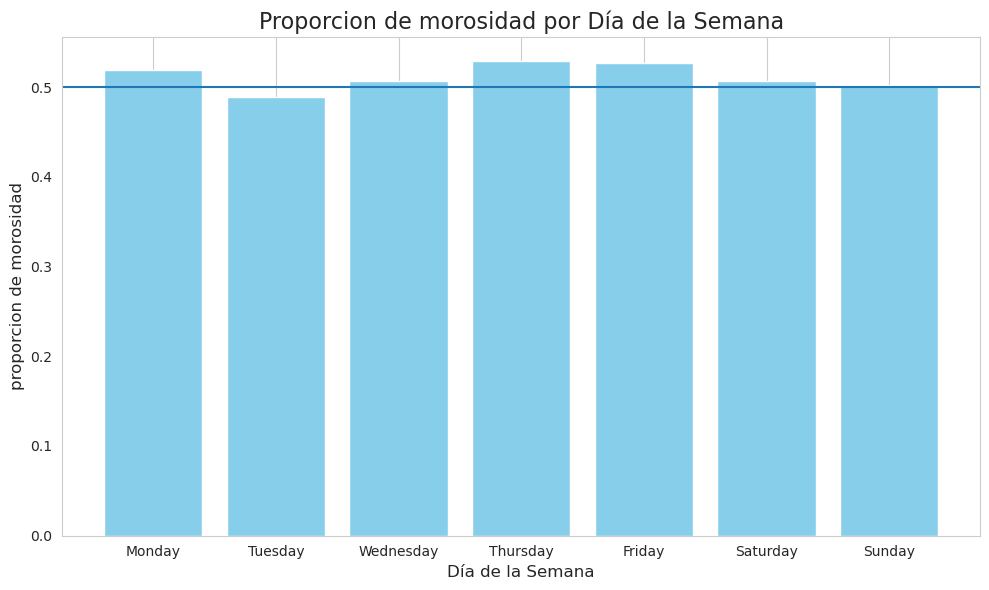

In [13]:
# Agrupar por día de la semana y sumar los valores de 'target'

df['day_of_week'] = df['borrow_timestamp'].dt.dayofweek

# Agrupar por día de la semana y sumar los valores de 'target'
weekly_data = df.groupby('day_of_week').agg({'target': 'mean'}).reset_index()

# Mapear números a nombres de días
day_names = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
weekly_data['day_name'] = weekly_data['day_of_week'].map(lambda x: day_names[x])

# Ordenar por días de la semana
weekly_data = weekly_data.sort_values('day_of_week')

# Graficar
plt.figure(figsize=(10, 6))

plt.bar(weekly_data['day_name'], weekly_data['target'], color='skyblue')
plt.title('Proporcion de morosidad por Día de la Semana', fontsize=16)
plt.xlabel('Día de la Semana', fontsize=12)
plt.ylabel('proporcion de morosidad', fontsize=12)
plt.grid(axis='y')
plt.axhline(y=0.5)
plt.tight_layout()
plt.show()



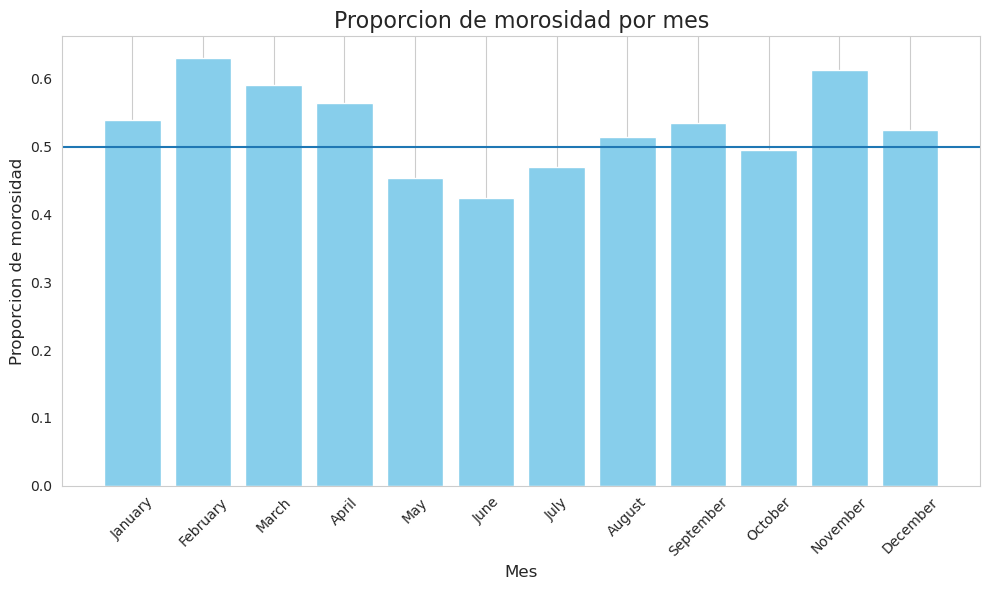

In [14]:
# Extraer el mes de 'borrow_timestamp'
df['month'] = df['borrow_timestamp'].dt.month

# Agrupar por mes y sumar los valores de 'target'
monthly_data = df.groupby('month').agg({'target': 'mean'}).reset_index()

# Mapear números de meses a nombres
month_names = [
    'January', 'February', 'March', 'April', 'May', 'June',
    'July', 'August', 'September', 'October', 'November', 'December'
]
monthly_data['month_name'] = monthly_data['month'].map(lambda x: month_names[x - 1])

# Ordenar por mes
monthly_data = monthly_data.sort_values('month')

# Graficar
plt.figure(figsize=(10, 6))
plt.axhline(y=0.5)
plt.bar(monthly_data['month_name'], monthly_data['target'], color='skyblue')
plt.title('Proporcion de morosidad por mes', fontsize=16)
plt.xlabel('Mes', fontsize=12)
plt.ylabel('Proporcion de morosidad', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.tight_layout()
plt.show()

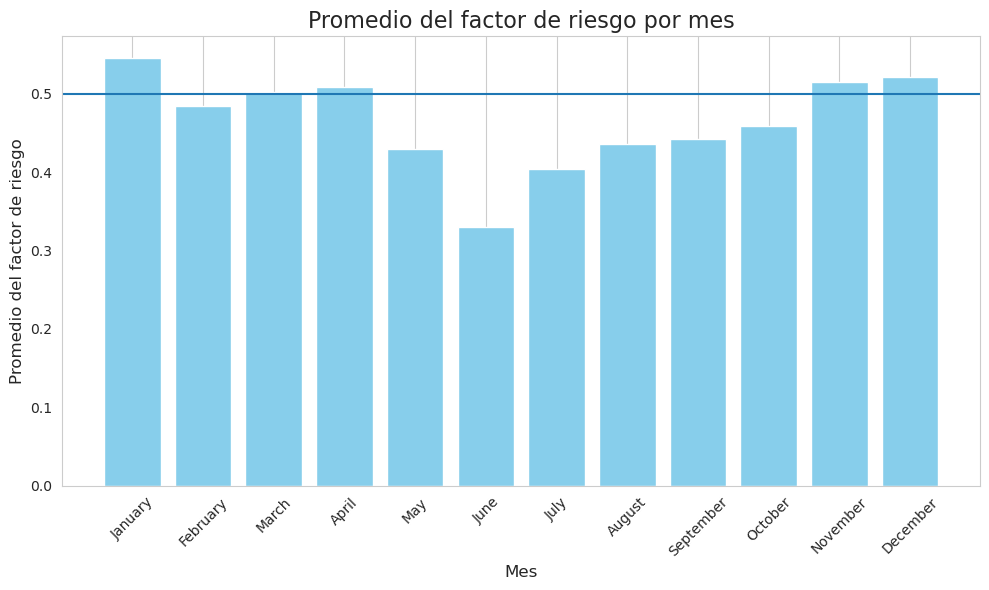

In [15]:
df['month'] = df['borrow_timestamp'].dt.month

# Agrupar por mes y sumar los valores de 'target'
monthly_data = df.groupby('month').agg({'risk_factor': 'mean'}).reset_index()

# Mapear números de meses a nombres
month_names = [
    'January', 'February', 'March', 'April', 'May', 'June',
    'July', 'August', 'September', 'October', 'November', 'December'
]
monthly_data['month_name'] = monthly_data['month'].map(lambda x: month_names[x - 1])

# Ordenar por mes
monthly_data = monthly_data.sort_values('month')

# Graficar
plt.figure(figsize=(10, 6))
plt.axhline(y=0.5)
plt.bar(monthly_data['month_name'], monthly_data['risk_factor'], color='skyblue')
plt.title('Promedio del factor de riesgo por mes', fontsize=16)
plt.xlabel('Mes', fontsize=12)
plt.ylabel('Promedio del factor de riesgo', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.tight_layout()
plt.show()

In [16]:
# Seleccionar solo las columnas numéricas
numerical_features = df.select_dtypes(include=['float64', 'int64'])

# Calcular la matriz de correlación
correlation_matrix = numerical_features.corr()

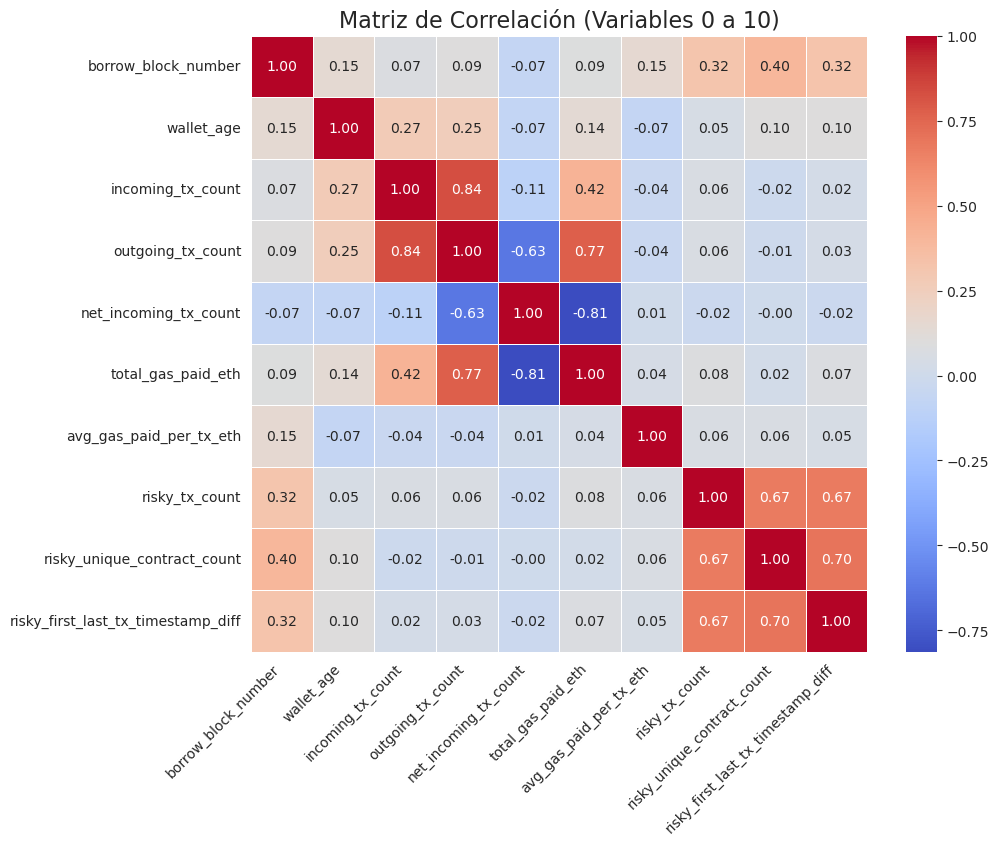

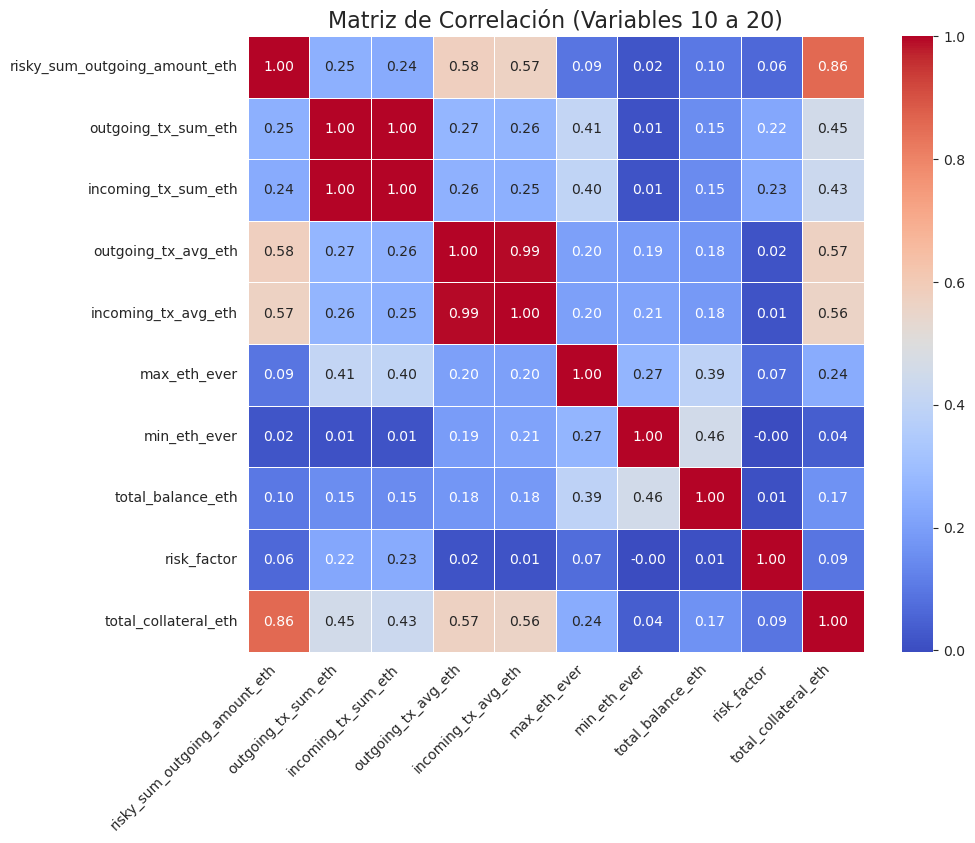

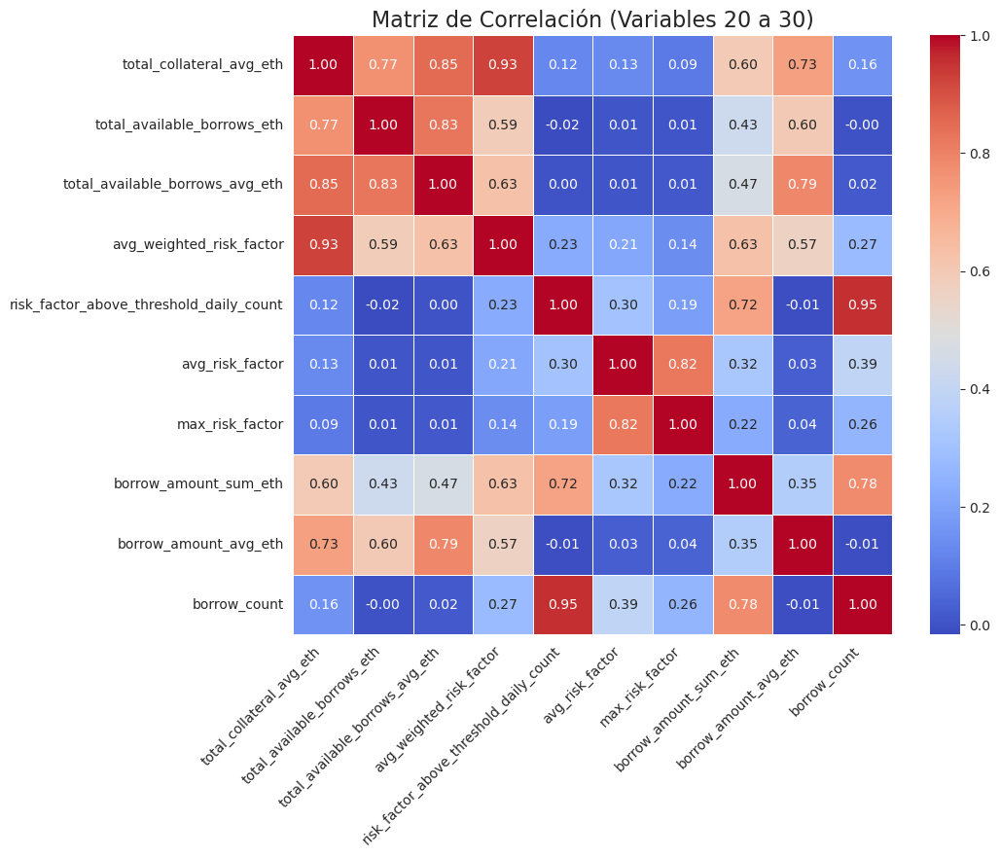

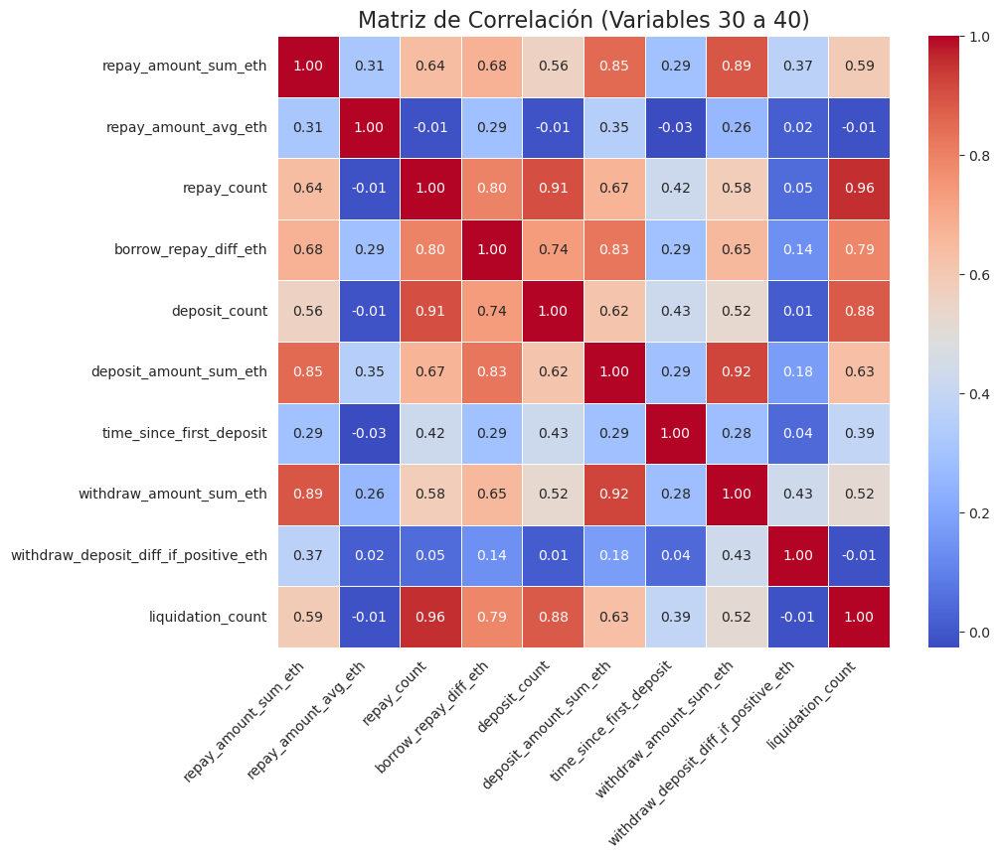

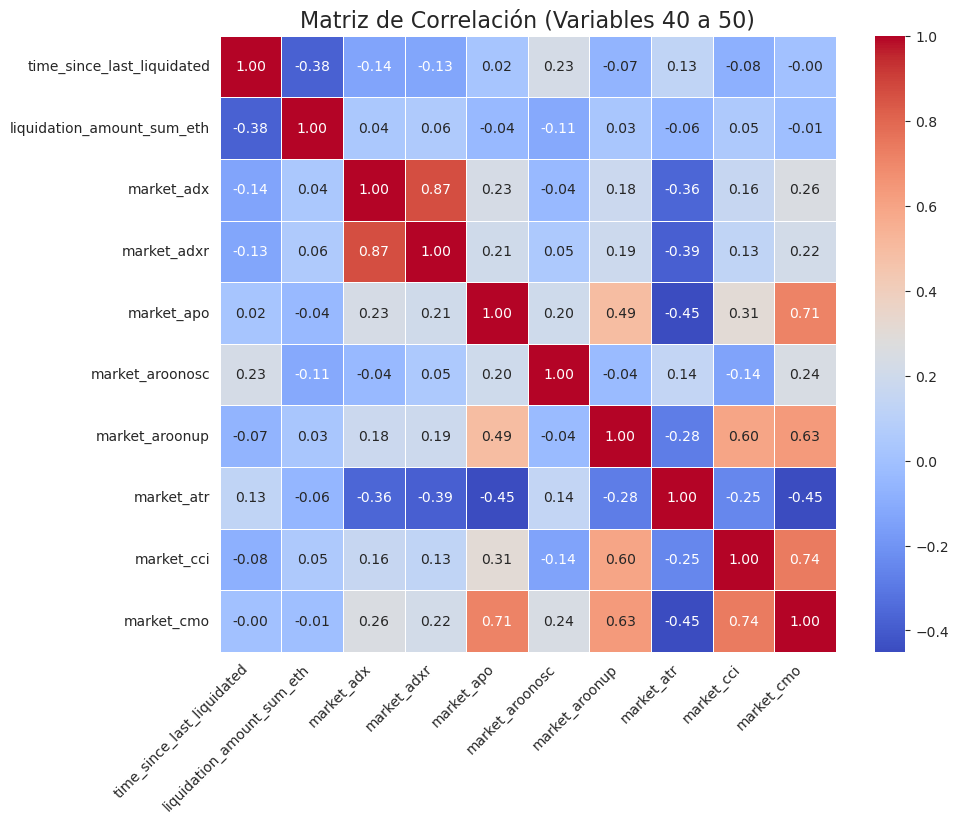

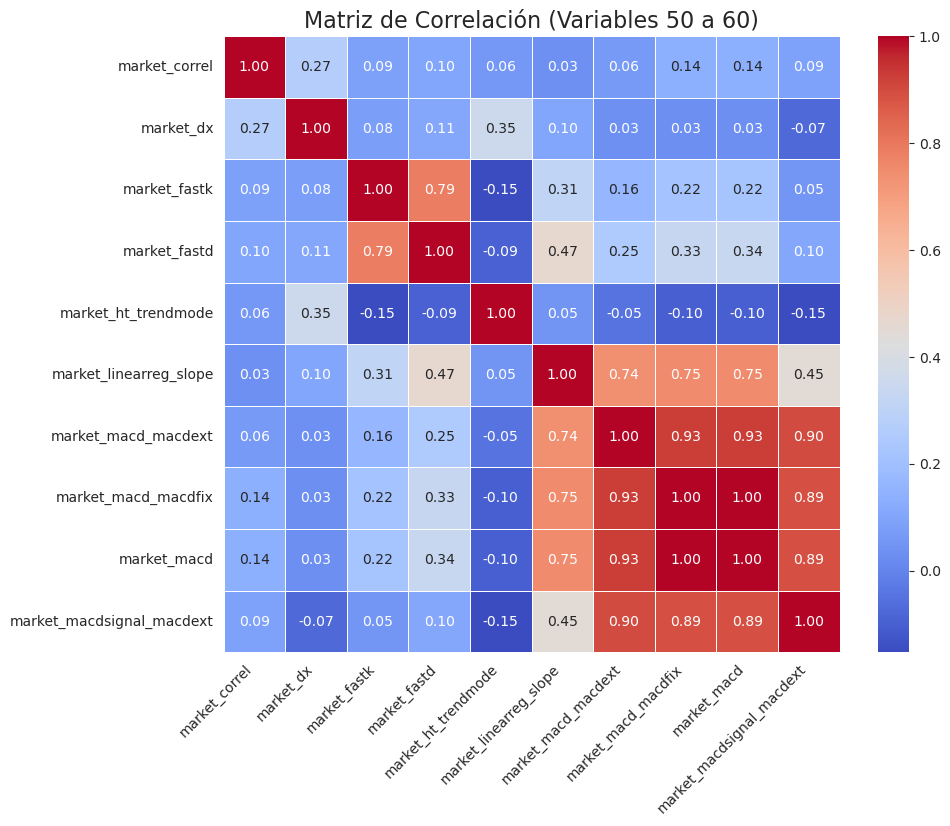

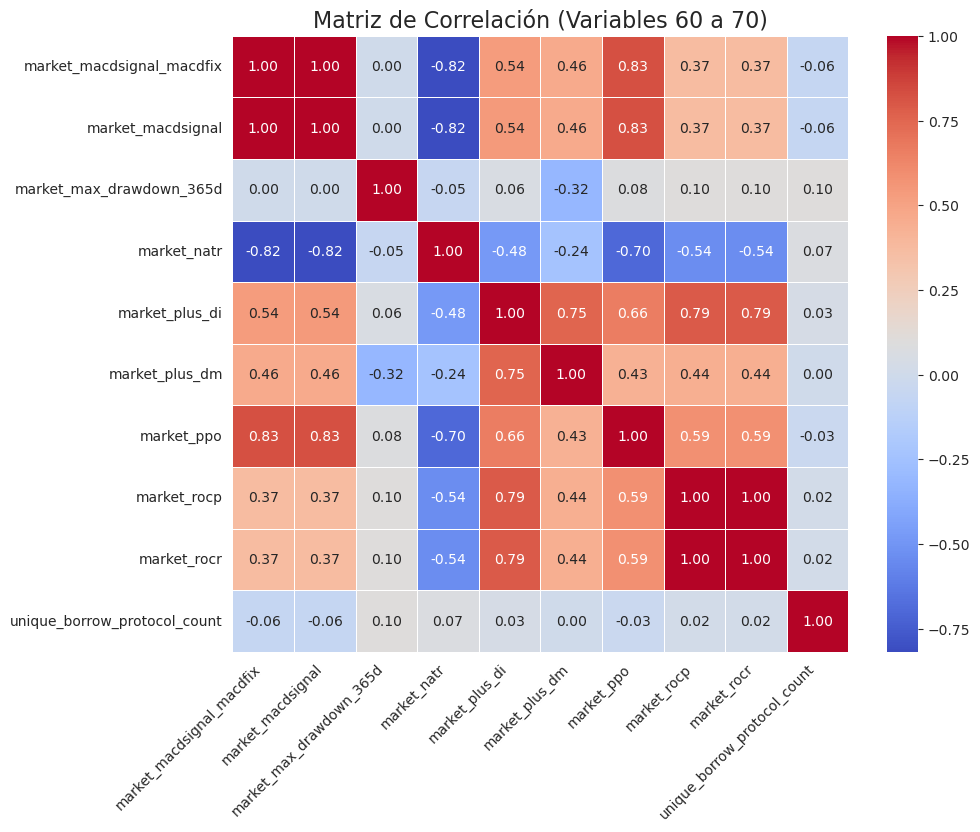

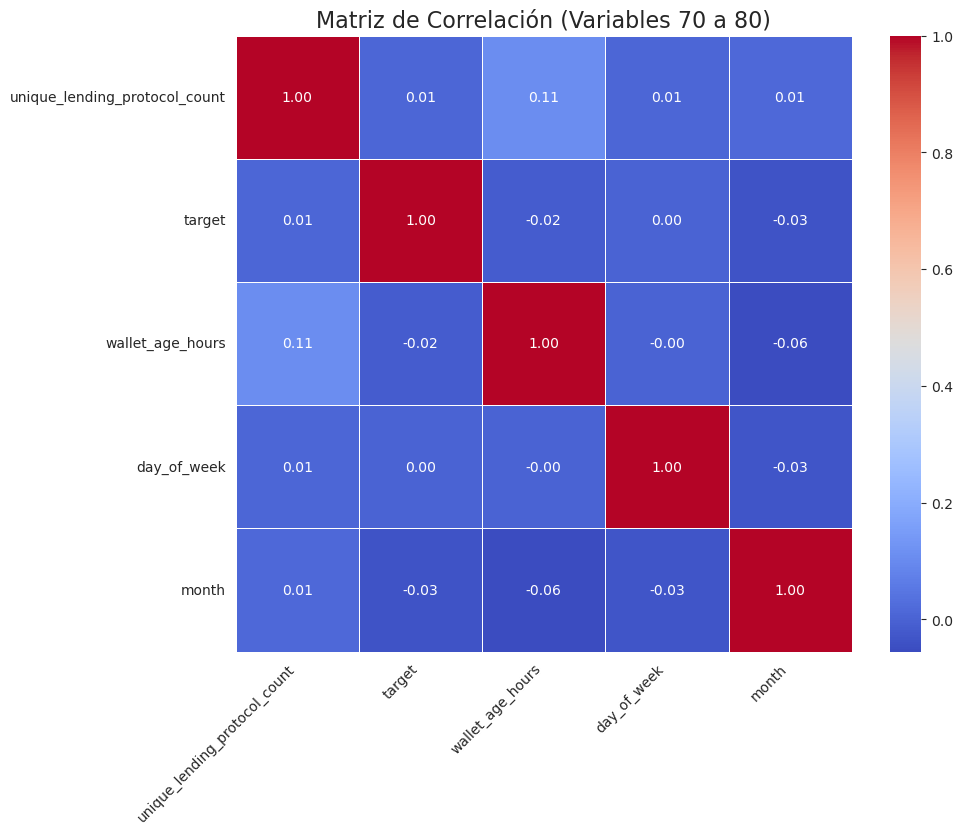

In [17]:
import math

# Definir el tamaño del bloque (número de columnas por trozo)
block_size = 10
num_blocks = math.ceil(len(correlation_matrix) / block_size)

# Crear trozos de la matriz de correlación
for i in range(num_blocks):
    start = i * block_size
    end = start + block_size
    subset_corr = correlation_matrix.iloc[start:end, start:end]

    # Graficar el subset
    plt.figure(figsize=(10, 8))
    sns.heatmap(subset_corr, 
                annot=True, 
                annot_kws={"size": 10}, 
                cmap='coolwarm', 
                fmt=".2f", 
                cbar=True, 
                square=True, 
                linewidths=0.5)
    plt.title(f'Matriz de Correlación (Variables {start} a {end})', fontsize=16)
    plt.xticks(rotation=45, fontsize=10, ha='right')
    plt.yticks(rotation=0, fontsize=10)
    plt.show()

> Con esto es posible eliminar ciertas variables altamente correlacionadas entre sí.

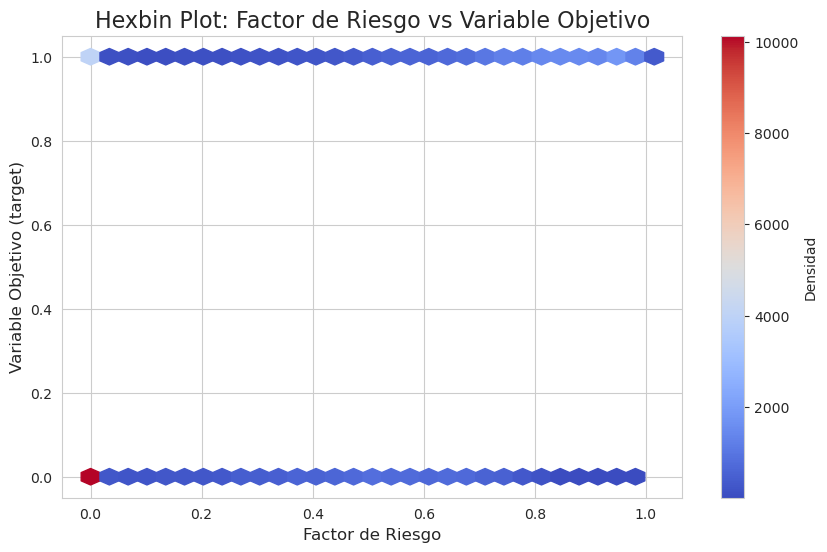

In [18]:
plt.figure(figsize=(10, 6))

# Crear el hexbin plot
plt.hexbin(df['risk_factor'], df['target'], gridsize=30, cmap='coolwarm', mincnt=1)

# Añadir colorbar para interpretar la densidad
plt.colorbar(label='Densidad')

# Títulos y etiquetas
plt.title('Hexbin Plot: Factor de Riesgo vs Variable Objetivo', fontsize=16)
plt.xlabel('Factor de Riesgo', fontsize=12)
plt.ylabel('Variable Objetivo (target)', fontsize=12)

# Mostrar el gráfico
plt.show()

> Existe una alta densisdad de **No** morosos con factor de riesgo nulo, asi como morosos con un riesgo mayor a 0.

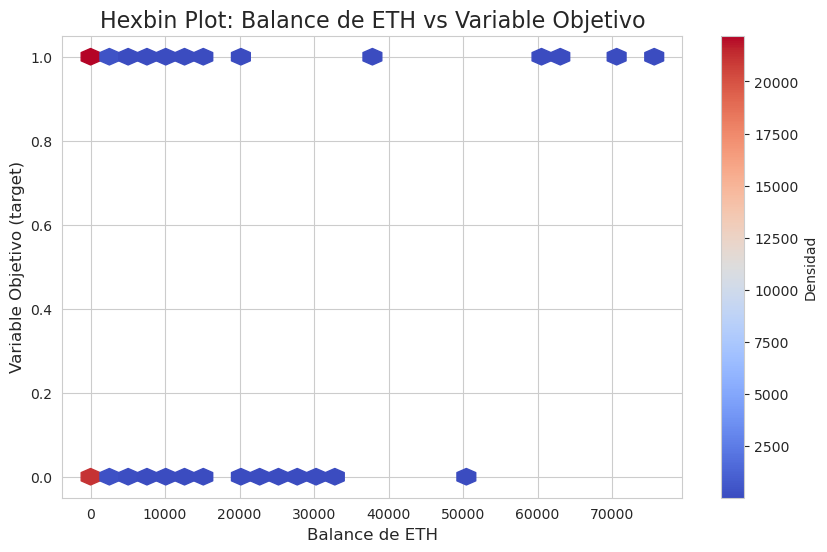

In [19]:
# CAntidad de eth en cartera versus morosidad

plt.figure(figsize=(10, 6))

# Crear el hexbin plot
plt.hexbin(df['total_balance_eth'], df['target'], gridsize=30, cmap='coolwarm', mincnt=1)

# Añadir colorbar para interpretar la densidad
plt.colorbar(label='Densidad')

# Títulos y etiquetas
plt.title('Hexbin Plot: Balance de ETH vs Variable Objetivo', fontsize=16)
plt.xlabel('Balance de ETH', fontsize=12)
plt.ylabel('Variable Objetivo (target)', fontsize=12)

# Mostrar el gráfico
plt.show()

> Los morosos tienden a tener mayor cantidad de ETH en sus carteras. Además, se observa una mayor densidad de morosos con ETH cercano a 0 en sus carteras.

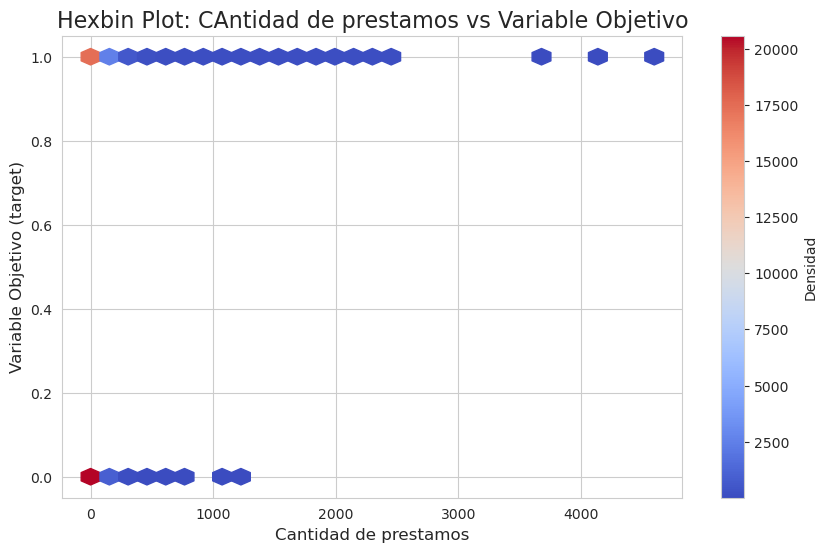

In [20]:
# CAntidad de prestamos versus morosidad

plt.figure(figsize=(10, 6))

# Crear el hexbin plot
plt.hexbin(df['borrow_count'], df['target'], gridsize=30, cmap='coolwarm', mincnt=1)

# Añadir colorbar para interpretar la densidad
plt.colorbar(label='Densidad')

# Títulos y etiquetas
plt.title('Hexbin Plot: CAntidad de prestamos vs Variable Objetivo', fontsize=16)
plt.xlabel('Cantidad de prestamos', fontsize=12)
plt.ylabel('Variable Objetivo (target)', fontsize=12)

# Mostrar el gráfico
plt.show()

> Los Morosos tienden a pedir más prestamos que los no morosos.

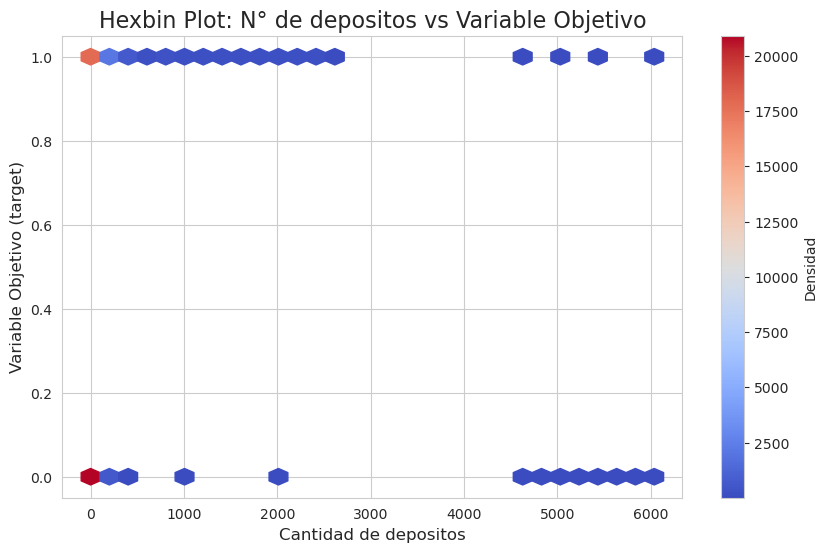

In [21]:
# Numeros de depositos versus variable target 


plt.figure(figsize=(10, 6))

# Crear el hexbin plot
plt.hexbin(df['deposit_count'], df['target'], gridsize=30, cmap='coolwarm', mincnt=1)

# Añadir colorbar para interpretar la densidad
plt.colorbar(label='Densidad')

# Títulos y etiquetas
plt.title('Hexbin Plot: N° de depositos vs Variable Objetivo', fontsize=16)
plt.xlabel('Cantidad de depositos', fontsize=12)
plt.ylabel('Variable Objetivo (target)', fontsize=12)

# Mostrar el gráfico
plt.show()

> La gente no morosa tiende a realizar un mayor número de depositos.

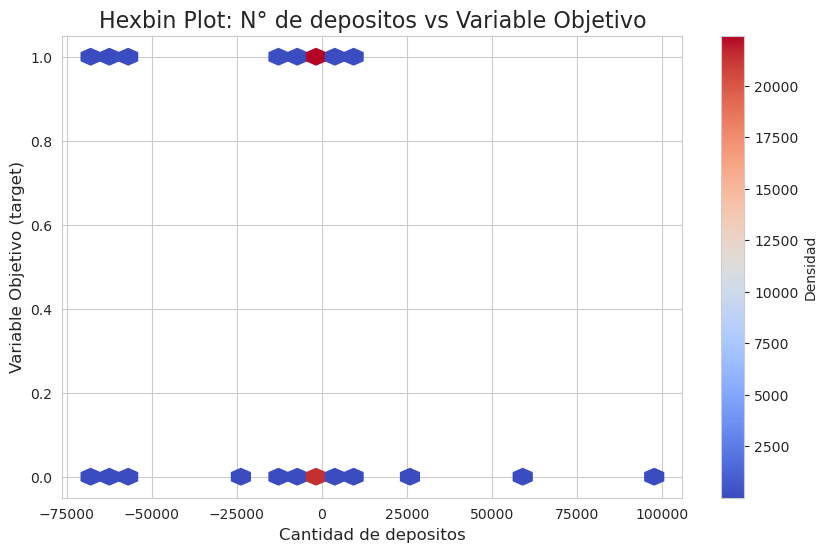

In [22]:
# Numeros de depositos versus variable target 


plt.figure(figsize=(10, 6))

# Crear el hexbin plot
plt.hexbin(df['net_incoming_tx_count'], df['target'], gridsize=30, cmap='coolwarm', mincnt=1)

# Añadir colorbar para interpretar la densidad
plt.colorbar(label='Densidad')

# Títulos y etiquetas
plt.title('Hexbin Plot: N° de depositos vs Variable Objetivo', fontsize=16)
plt.xlabel('Cantidad de depositos', fontsize=12)
plt.ylabel('Variable Objetivo (target)', fontsize=12)

# Mostrar el gráfico
plt.show()

> En billeteras morosas hay más transacciones salientes que entrantes, ya que distribuye a la izquierda del cero.


<Axes: >

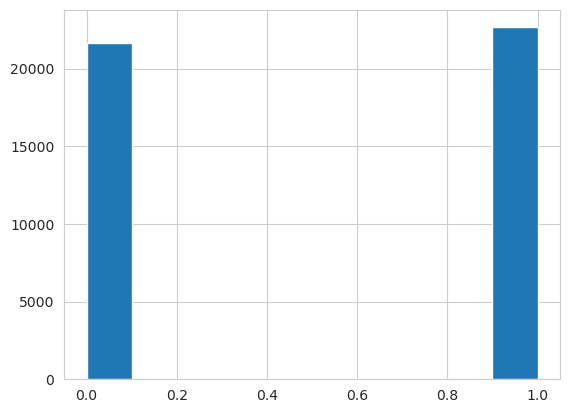

In [23]:
df['target'].hist()

> La variable target se encuentra balanceada.

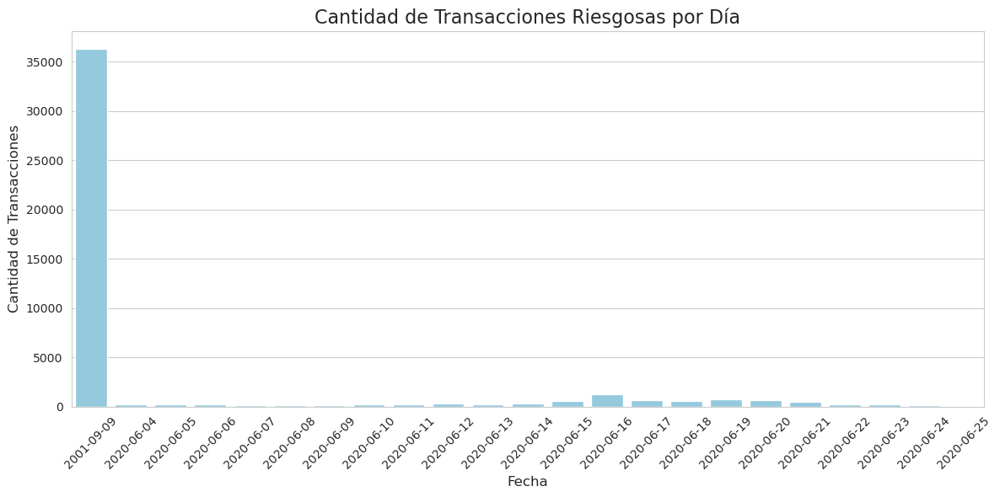

In [24]:
# Contar las transacciones riesgosas por día
risky_transactions_by_day = df['risky_first_tx_timestamp'].dt.date.value_counts().sort_index()

# Graficar las transacciones riesgosas por día
plt.figure(figsize=(12, 6))
sns.barplot(x=risky_transactions_by_day.index, y=risky_transactions_by_day.values, color='skyblue')

# Ajustar etiquetas del gráfico
plt.title('Cantidad de Transacciones Riesgosas por Día', fontsize=16)
plt.xlabel('Fecha', fontsize=12)
plt.ylabel('Cantidad de Transacciones', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()

# Mostrar el gráfico
plt.show()

> Las billeteras en 2001-09-09 **NO** tienen transacciones riesgosas.

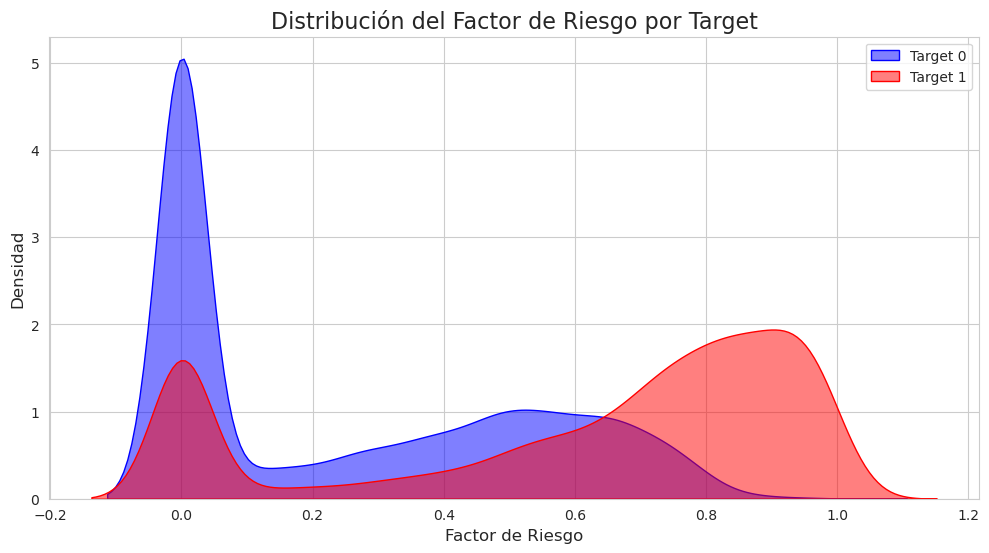

In [25]:
plt.figure(figsize=(12, 6))

# Graficar el factor de riesgo para target=0
sns.kdeplot(df[df['target'] == 0]['risk_factor'], fill=True, label='Target 0', alpha=0.5, color='blue')

# Graficar el factor de riesgo para target=1
sns.kdeplot(df[df['target'] == 1]['risk_factor'], fill=True, label='Target 1', alpha=0.5, color='red')

# Ajustar etiquetas y título
plt.title('Distribución del Factor de Riesgo por Target', fontsize=16)
plt.xlabel('Factor de Riesgo', fontsize=12)
plt.ylabel('Densidad', fontsize=12)
plt.legend()

# Mostrar el gráfico
plt.show()

> Las billeteras morososas tienen factores de riesgo más alto.

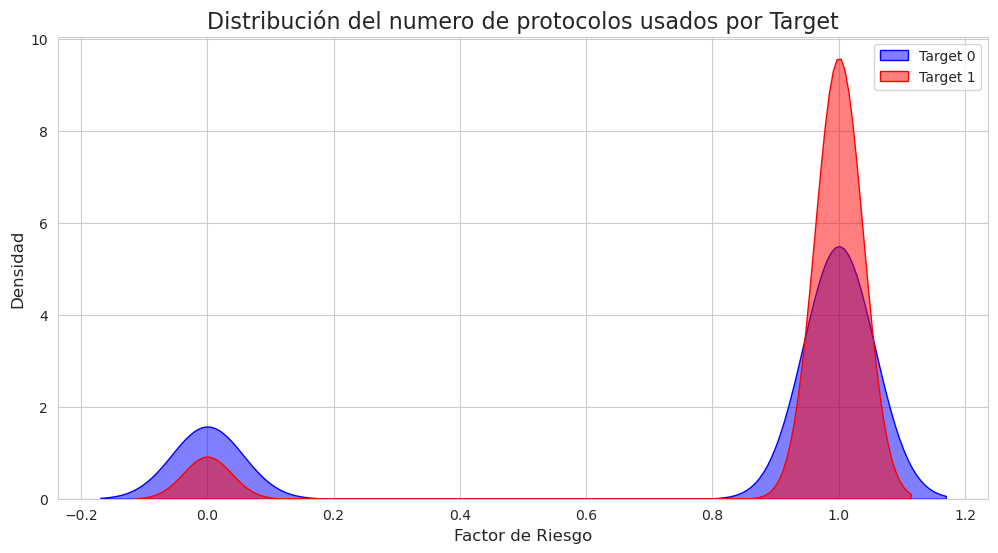

In [26]:

    plt.figure(figsize=(12, 6))
    
    # Graficar el factor de riesgo para target=0
    sns.kdeplot(df[df['target'] == 0]['unique_borrow_protocol_count'], fill=True, label='Target 0', alpha=0.5, color='blue')
    
    # Graficar el factor de riesgo para target=1
    sns.kdeplot(df[df['target'] == 1]['unique_borrow_protocol_count'], fill=True, label='Target 1', alpha=0.5, color='red')
    
    # Ajustar etiquetas y título
    plt.title('Distribución del numero de protocolos usados por Target', fontsize=16)
    plt.xlabel('Factor de Riesgo', fontsize=12)
    plt.ylabel('Densidad', fontsize=12)
    plt.legend()
    
    # Mostrar el gráfico
    plt.show()

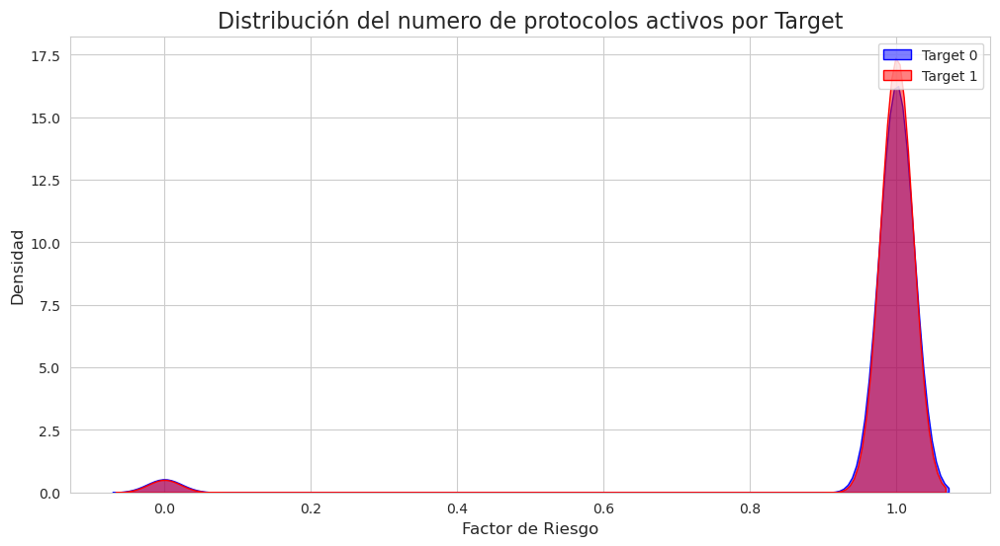

In [27]:
plt.figure(figsize=(12, 6))
    
# Graficar el factor de riesgo para target=0
sns.kdeplot(df[df['target'] == 0]['unique_lending_protocol_count'], fill=True, label='Target 0', alpha=0.5, color='blue')

# Graficar el factor de riesgo para target=1
sns.kdeplot(df[df['target'] == 1]['unique_lending_protocol_count'], fill=True, label='Target 1', alpha=0.5, color='red')

# Ajustar etiquetas y título
plt.title('Distribución del numero de protocolos activos por Target', fontsize=16)
plt.xlabel('Factor de Riesgo', fontsize=12)
plt.ylabel('Densidad', fontsize=12)
plt.legend()

# Mostrar el gráfico
plt.show()

> Con todo lo anterior, se seleccionan las caracteristicas no correlacionadas entre sí y que tienen un claro impacto en la variable objetivo.

In [31]:
df = df [[
    "wallet_age_hours", "month","day_of_week",
    "net_incoming_tx_count","total_gas_paid_eth","avg_gas_paid_per_tx_eth","risky_tx_count",
    "outgoing_tx_sum_eth","outgoing_tx_avg_eth","max_eth_ever","min_eth_ever",'total_balance_eth',"risk_factor",
    "avg_weighted_risk_factor","risk_factor_above_threshold_daily_count","avg_risk_factor","repay_amount_sum_eth",
    "time_since_last_liquidated","withdraw_deposit_diff_if_positive_eth",
    "market_adx","market_apo","market_aroonosc","market_correl",
    "market_dx","market_fastk","market_ht_trendmode","market_linearreg_slope",
    "market_max_drawdown_365d","market_plus_di","unique_borrow_protocol_count","unique_lending_protocol_count",
    "target"  
]]

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44296 entries, 0 to 44295
Data columns (total 32 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   wallet_age_hours                         44296 non-null  float64
 1   month                                    44296 non-null  int64  
 2   day_of_week                              44296 non-null  int64  
 3   net_incoming_tx_count                    44296 non-null  int64  
 4   total_gas_paid_eth                       44296 non-null  float64
 5   avg_gas_paid_per_tx_eth                  44296 non-null  float64
 6   risky_tx_count                           44296 non-null  int64  
 7   outgoing_tx_sum_eth                      44296 non-null  float64
 8   outgoing_tx_avg_eth                      44296 non-null  float64
 9   max_eth_ever                             44296 non-null  float64
 10  min_eth_ever                             44296

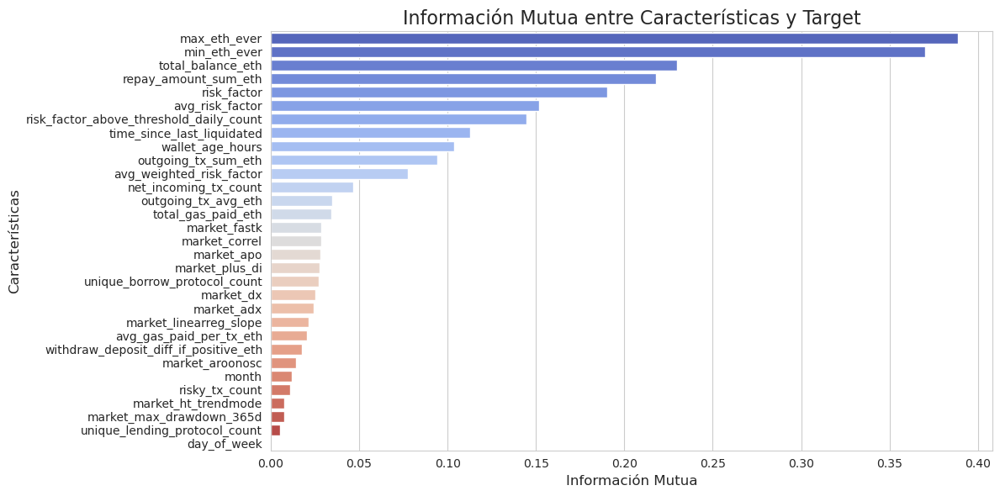

In [32]:
from sklearn.feature_selection import mutual_info_classif


X = df.drop(columns=['target'])  # Reemplaza 'target' con el nombre de tu columna objetivo
y = df['target']

# Calcular la información mutua
info_mutua = mutual_info_classif(X, y, random_state=42)

# Crear un DataFrame con los resultados
info_mutua_df = pd.DataFrame({'Feature': X.columns, 'Mutual Information': info_mutua})

# Ordenar las características por importancia
info_mutua_df = info_mutua_df.sort_values(by='Mutual Information', ascending=False)

# Graficar
plt.figure(figsize=(12, 6))
sns.barplot(x='Mutual Information', y='Feature', data=info_mutua_df, palette='coolwarm')
plt.title('Información Mutua entre Características y Target', fontsize=16)
plt.xlabel('Información Mutua', fontsize=12)
plt.ylabel('Características', fontsize=12)
plt.tight_layout()
plt.show()

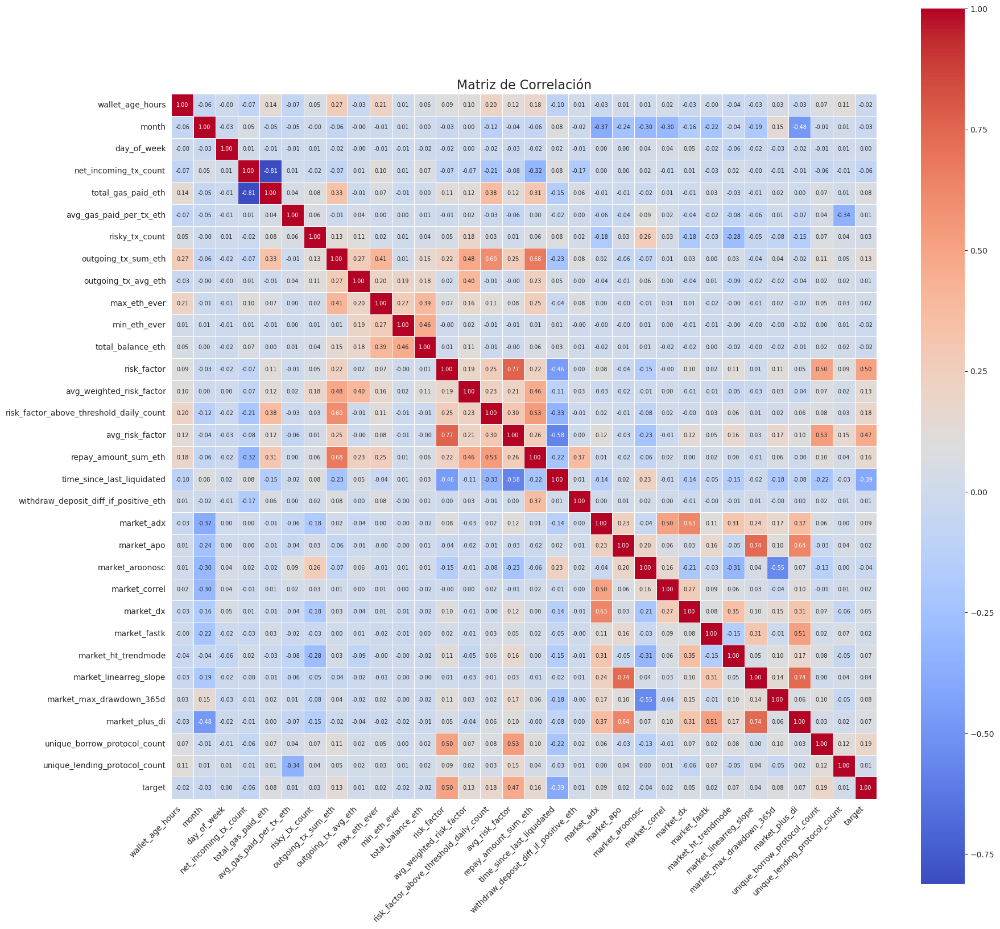

In [34]:
subset_corr = df.corr()

plt.figure(figsize=(20, 20))
sns.heatmap(subset_corr, 
            annot=True, 
            annot_kws={"size": 7}, 
            cmap='coolwarm', 
            fmt=".2f", 
            cbar=True, 
            square=True, 
            linewidths=0.5)
plt.title(f'Matriz de Correlación', fontsize=16)
plt.xticks(rotation=45, fontsize=10, ha='right')
plt.yticks(rotation=0, fontsize=10)
plt.show()

> Ya no existen variables demasiado correlacionadas.

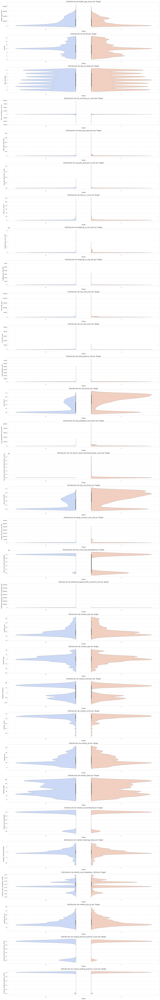

In [24]:
import matplotlib.pyplot as plt
import seaborn as sns

# Seleccionar solo las características numéricas
numeric_features = df.select_dtypes(include=['float64', 'int64']).columns
numeric_features = numeric_features.drop('target', errors='ignore')  # Excluir 'target'

# Configurar el tamaño del lienzo
plt.figure(figsize=(20, len(numeric_features) * 4))

# Crear un subplot para cada característica numérica
for i, feature in enumerate(numeric_features, 1):
    plt.subplot(len(numeric_features), 1, i)  # Filas = número de características, columnas = 1
    sns.violinplot(data=df, x='target', y=feature, palette='coolwarm', split=True, alpha=0.7)
    plt.title(f'Distribución de {feature} por Target', fontsize=14)
    plt.xlabel('Target', fontsize=12)
    plt.ylabel(feature, fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

# Ajustar el diseño para evitar solapamientos
plt.tight_layout()
plt.show()

In [29]:
(df['time_since_last_liquidated']/3600).value_counts()

277777.777500    34327
65.335833            7
1.103056             5
9.647778             5
65.322222            4
0.431389             4
0.438611             4
0.446667             4
1.105000             4
5.041667             4
0.131944             4
1.177778             4
0.427500             4
4.725833             4
0.442778             3
0.588889             3
51.268611            3
51.266389            3
51.265556            3
0.219722             3
1.088056             3
9.205556             3
51.318889            3
51.325000            3
5.312500             3
65.346389            3
65.353889            3
7.493889             2
1.498611             2
4.209444             2
5.985833             2
0.322500             2
0.173889             2
2359.283056          2
20.744444            2
0.338056             2
0.946389             2
0.449167             2
0.815278             2
0.798611             2
2.493611             2
0.065278             2
9.701944             2
23.648611  

In [33]:
df['withdraw_deposit_diff_if_positive_eth'].value_counts()

0.000000e+00    42002
3.577866e+01       25
5.305814e+01       25
8.669903e+02       25
1.017914e+03       19
3.415594e-06       18
1.688094e+01       17
3.466599e+04       14
3.371922e+04       13
5.712920e+00       13
2.281977e+01       13
9.169827e+02       13
1.010213e+02       13
1.016981e+03       12
2.214215e+01       12
1.572223e+02       12
1.217936e-01       11
2.537224e+01       10
5.875210e+00       10
2.271970e+01       10
2.089685e+01       10
2.658590e+01        9
2.241182e+01        9
2.353384e+01        9
6.002602e+02        9
2.284091e+01        9
2.214102e+01        8
2.504919e+04        8
6.715324e+00        8
8.906416e+00        7
2.226249e+01        7
9.152178e+02        7
1.639304e+02        7
1.471118e+02        7
2.635190e+01        7
2.082619e+03        7
2.089684e+01        6
3.437572e+02        6
1.017222e+03        6
6.014028e+02        6
3.572910e+04        6
3.866599e+04        6
2.732739e+04        6
1.648185e+02        5
3.408196e+04        5
1.455539e+

In [34]:
df['avg_weighted_risk_factor'].value_counts()

0.000000e+00    10288
9.626214e-02        9
9.399848e+01        6
2.103606e+01        6
8.310208e+02        5
7.111672e+01        5
1.556787e+02        5
9.626214e-02        4
1.281123e+02        4
1.207285e+00        4
3.037995e+02        4
2.085314e+01        3
7.526814e+02        3
6.573010e+02        3
2.067337e+01        3
1.356967e+03        3
6.254302e+01        3
4.140903e+02        3
5.590399e+01        3
5.590399e+01        3
1.080468e+00        3
1.596294e+01        3
1.506065e-02        3
4.429692e+02        3
1.114445e+00        3
2.506588e+01        3
1.822788e+00        3
4.948550e-07        3
3.781472e+02        3
2.658818e+02        3
2.285089e+02        3
2.122222e+01        3
9.335617e+00        2
4.155628e-02        2
5.471750e-01        2
1.957636e-02        2
1.020420e-02        2
6.080388e-01        2
1.723378e-03        2
1.646644e+00        2
9.493750e+00        2
2.360647e+00        2
1.692982e+01        2
1.313109e+01        2
2.424335e+02        2
4.449178e-

In [44]:
df['risk_factor_above_threshold_daily_count'].value_counts()

0.0          24930
1.0            674
2.0            487
3.0            483
4.0            351
6.0            351
5.0            276
10.0           261
8.0            231
7.0            214
9.0            204
12.0           195
15.0           155
11.0           154
13.0           143
16.0           131
14.0           127
17.0           115
21.0           114
20.0           112
18.0           108
22.0            96
19.0            95
24.0            91
26.0            86
23.0            78
30.0            78
25.0            77
32.0            76
27.0            76
28.0            70
36.0            70
29.0            69
33.0            69
42.0            66
34.0            63
45.0            62
39.0            61
31.0            61
44.0            60
50.0            59
40.0            57
37.0            56
48.0            52
43.0            51
54.0            51
38.0            50
35.0            50
51.0            48
41.0            46
47.0            45
60.0            44
49.0        

# Selección de caracteristicas

In [33]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
import matplotlib.pyplot as plt
import seaborn as sns

# Seleccionar solo las características numéricas
X = df.select_dtypes(include=['float64', 'int64']).drop(columns=['target'], errors='ignore')

# Estandarizar las características (es importante para PCA)
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

In [34]:
from sklearn.linear_model import Lasso
from sklearn.model_selection import train_test_split

# Dividir los datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Ajustar el modelo Lasso con un parámetro alpha inicial
alpha = 0.005  # Regularización; ajusta este valor si es necesario
lasso = Lasso(alpha=alpha, random_state=42)
lasso.fit(X_train, y_train)

# Identificar las características seleccionadas
selected_features = X.columns[(lasso.coef_ != 0)]
print(f"Características seleccionadas: {selected_features.tolist()}")

# Evaluar el modelo
train_score = lasso.score(X_train, y_train)
test_score = lasso.score(X_test, y_test)
print(f"Puntaje en entrenamiento: {train_score:.4f}")
print(f"Puntaje en prueba: {test_score:.4f}")



Características seleccionadas: ['wallet_age_hours', 'risk_factor', 'avg_risk_factor', 'time_since_last_liquidated', 'market_aroonosc', 'unique_borrow_protocol_count']
Puntaje en entrenamiento: 0.2966
Puntaje en prueba: 0.3068


                                    Feature  Importance
12                              risk_factor    0.158493
15                          avg_risk_factor    0.086495
14  risk_factor_above_threshold_daily_count    0.080952
0                          wallet_age_hours    0.048064
8                       outgoing_tx_avg_eth    0.042713
9                              max_eth_ever    0.042080
4                        total_gas_paid_eth    0.041498
5                   avg_gas_paid_per_tx_eth    0.040828
3                     net_incoming_tx_count    0.040328
7                       outgoing_tx_sum_eth    0.039279


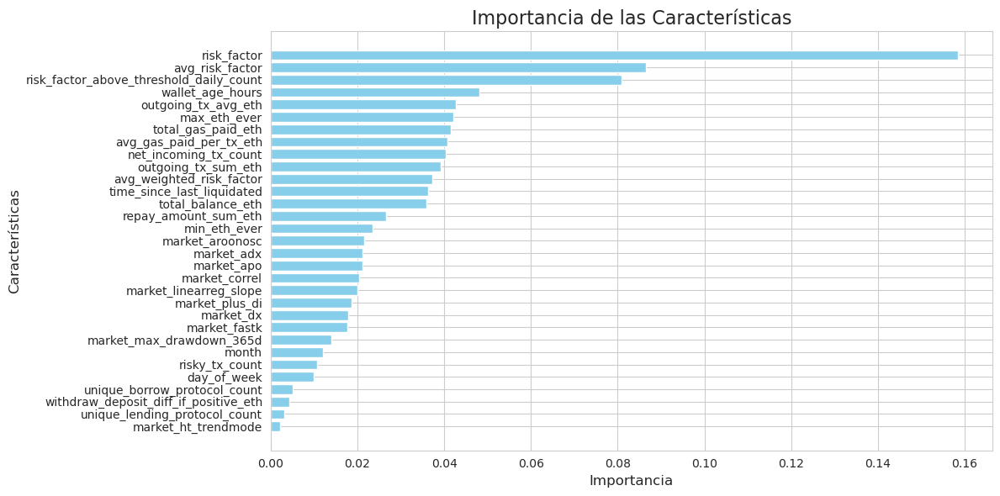

In [35]:
import pandas as pd
import matplotlib.pyplot as plt

# Entrenar el modelo RandomForest
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier(random_state=42)
model.fit(X_scaled, y)

# Obtener la importancia de las características
feature_importances = model.feature_importances_

# Crear un DataFrame para facilitar el análisis
importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

# Mostrar las 10 características más importantes
print(importance_df.head(10))

# Graficar la importancia de las características
plt.figure(figsize=(12, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
plt.gca().invert_yaxis()  # Invertir el eje Y para mostrar las características más importantes primero
plt.title('Importancia de las Características', fontsize=16)
plt.xlabel('Importancia', fontsize=12)
plt.ylabel('Características', fontsize=12)
plt.tight_layout()
plt.show()

In [36]:
df_selected = df[[
    'wallet_age_hours', "risk_factor", "avg_risk_factor", "time_since_last_liquidated", "market_aroonosc","unique_borrow_protocol_count",
    "risk_factor_above_threshold_daily_count","outgoing_tx_avg_eth","max_eth_ever","total_gas_paid_eth","avg_gas_paid_per_tx_eth","net_incoming_tx_count","target"
]]

X = df_selected.select_dtypes(include=['float64', 'int64']).drop(columns=['target'], errors='ignore')

# Estandarizar las características (es importante para PCA)
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

In [37]:
df_selected.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44296 entries, 0 to 44295
Data columns (total 13 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   wallet_age_hours                         44296 non-null  float64
 1   risk_factor                              44296 non-null  float64
 2   avg_risk_factor                          44296 non-null  float64
 3   time_since_last_liquidated               44296 non-null  float64
 4   market_aroonosc                          44296 non-null  float64
 5   unique_borrow_protocol_count             44296 non-null  int64  
 6   risk_factor_above_threshold_daily_count  44296 non-null  float64
 7   outgoing_tx_avg_eth                      44296 non-null  float64
 8   max_eth_ever                             44296 non-null  float64
 9   total_gas_paid_eth                       44296 non-null  float64
 10  avg_gas_paid_per_tx_eth                  44296

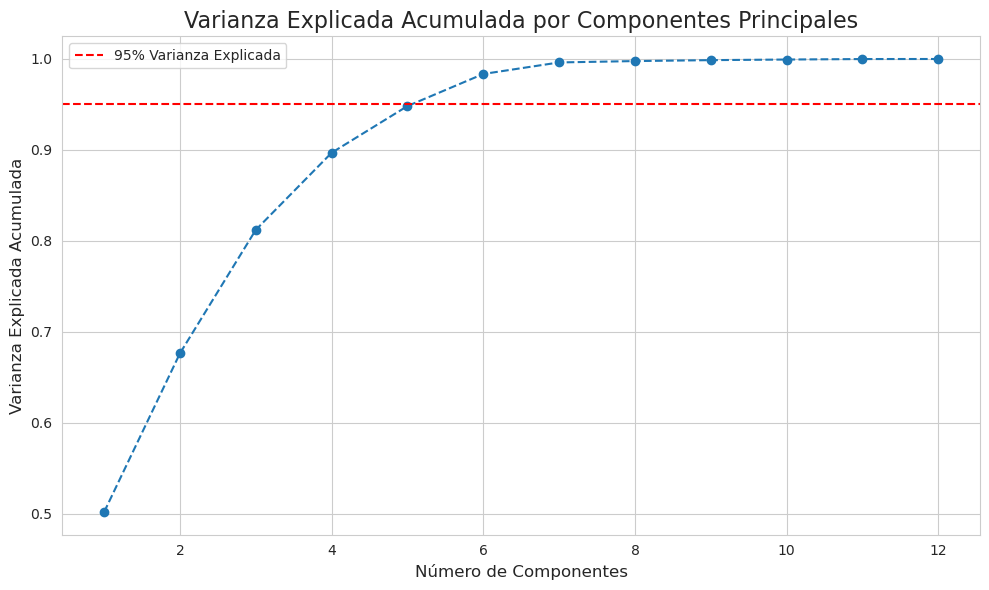

Número óptimo de componentes para capturar el 95% de la varianza: 6


In [38]:
# Aplicar PCA con todos los componentes
pca_full = PCA()
X_pca_full = pca_full.fit_transform(X_scaled)

# Calcular la varianza explicada acumulada
explained_variance_ratio = pca_full.explained_variance_ratio_.cumsum()

# Graficar la varianza explicada acumulada
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker='o', linestyle='--')
plt.axhline(y=0.95, color='r', linestyle='--', label='95% Varianza Explicada')  # Línea para el 95%
plt.title('Varianza Explicada Acumulada por Componentes Principales', fontsize=16)
plt.xlabel('Número de Componentes', fontsize=12)
plt.ylabel('Varianza Explicada Acumulada', fontsize=12)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Determinar el número óptimo de componentes
optimal_components = (explained_variance_ratio >= 0.95).argmax() + 1
print(f"Número óptimo de componentes para capturar el 95% de la varianza: {optimal_components}")


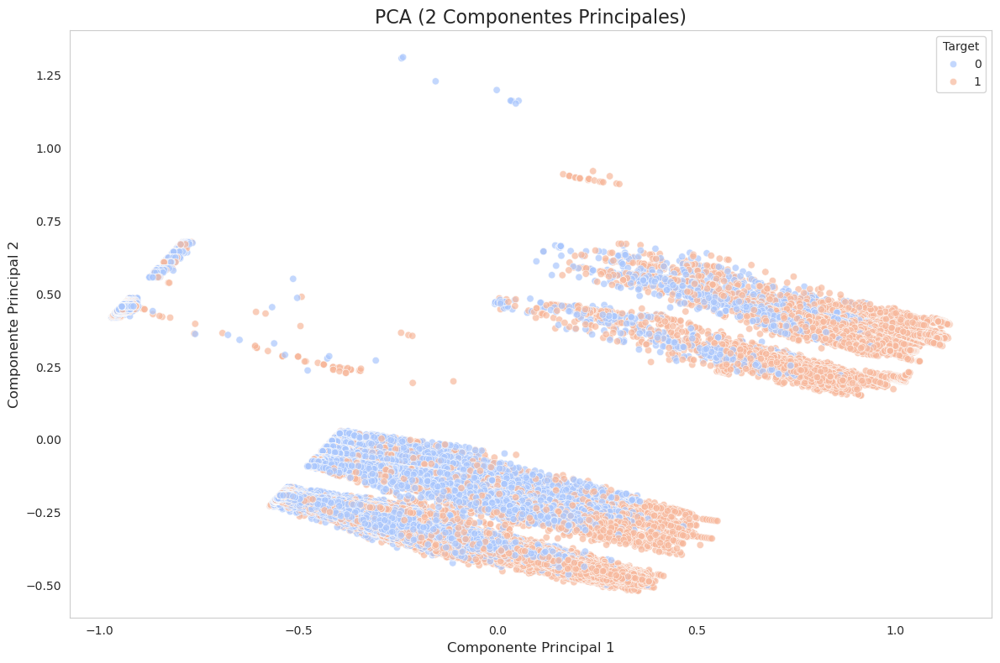

In [39]:
from sklearn.decomposition import PCA
X = df.select_dtypes(include=['float64', 'int64']).drop(columns=['target'], errors='ignore')
y = df['target']  # Variable objetivo

# Aplicar PCA con 2 componentes principales
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Crear un DataFrame con los componentes principales
pca_df = pd.DataFrame(X_pca, columns=['PCA1', 'PCA2'])
pca_df['target'] = y.values  # Agregar la variable objetivo para diferenciar grupos

# Graficar los datos en las dos dimensiones principales
plt.figure(figsize=(12, 8))
sns.scatterplot(data=pca_df, x='PCA1', y='PCA2', hue='target', palette='coolwarm', alpha=0.7)
plt.title('PCA (2 Componentes Principales)', fontsize=16)
plt.xlabel('Componente Principal 1', fontsize=12)
plt.ylabel('Componente Principal 2', fontsize=12)
plt.legend(title='Target')
plt.grid()
plt.tight_layout()
plt.show()


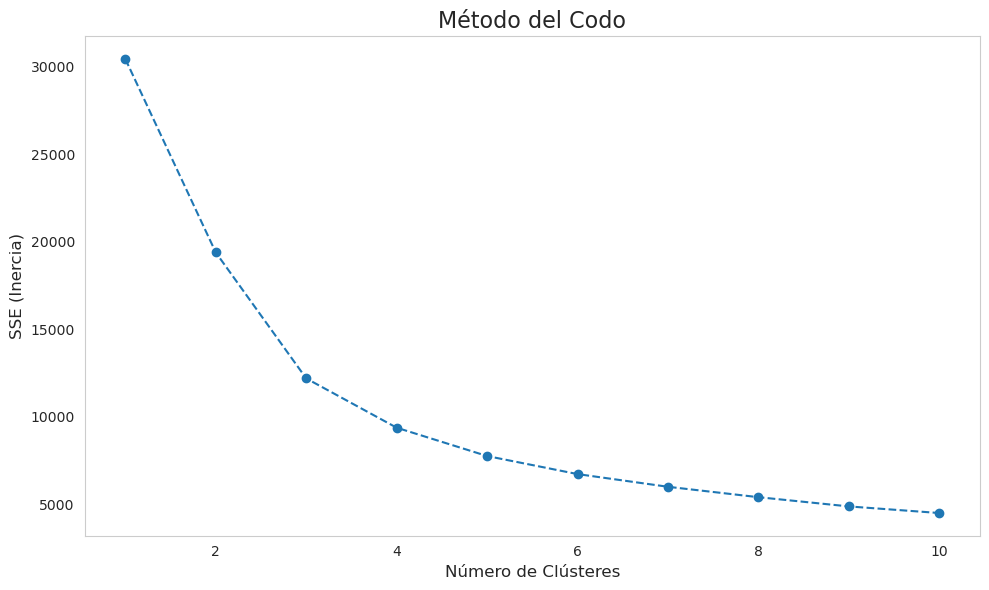

In [40]:
from sklearn.cluster import KMeans


# Calcular el SSE para diferentes números de clústeres
sse = []
cluster_range = range(1, 11)
for k in cluster_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_pca_full)
    sse.append(kmeans.inertia_)

# Graficar el Método del Codo
plt.figure(figsize=(10, 6))
plt.plot(cluster_range, sse, marker='o', linestyle='--')
plt.title('Método del Codo', fontsize=16)
plt.xlabel('Número de Clústeres', fontsize=12)
plt.ylabel('SSE (Inercia)', fontsize=12)
plt.grid()
plt.tight_layout()
plt.show()


In [41]:
# Aplicar K-Means con un número inicial de clústeres (por ejemplo, 3)
kmeans = KMeans(n_clusters=4, random_state=42)
kmeans.fit(X_scaled)

# Agregar los resultados al DataFrame original
df_selected['cluster'] = kmeans.labels_

# Visualizar la asignación de clústeres
print(df_selected[['cluster']].value_counts())

cluster
0          15541
1          12077
2           9916
3           6762
dtype: int64


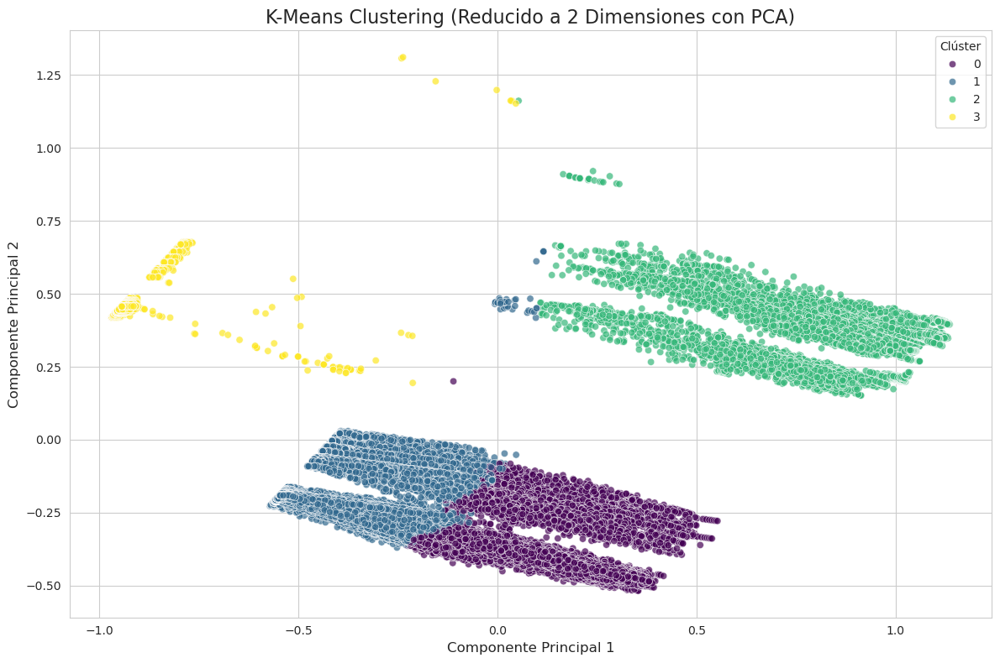

In [42]:
pca_df = pd.DataFrame(X_pca, columns=['PCA1', 'PCA2'])
pca_df['cluster'] = kmeans.labels_

# Graficar los clústeres
plt.figure(figsize=(12, 8))
sns.scatterplot(data=pca_df, x='PCA1', y='PCA2', hue='cluster', palette='viridis', alpha=0.7)
plt.title('K-Means Clustering (Reducido a 2 Dimensiones con PCA)', fontsize=16)
plt.xlabel('Componente Principal 1', fontsize=12)
plt.ylabel('Componente Principal 2', fontsize=12)
plt.legend(title='Clúster')
plt.tight_layout()
plt.show()

> A continación el df con las caracteristicas más relevantes para el problema

# Pipeline de preprocesamiento

In [1]:
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.base import BaseEstimator, TransformerMixin
import pandas as pd
import numpy as np
import joblib

# Leer datos
X = pd.read_parquet("../data/raw/X_t0.parquet")
y = pd.read_parquet("../data/raw/y_t0.parquet")
df = pd.concat([X, y], axis=1)

# Custom Transformer para procesar timestamps y crear 'wallet_age_hours'
class WalletAgeTransformer(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X = X.copy()
        X['last_tx_timestamp'] = pd.to_datetime(X['last_tx_timestamp'])
        X['first_tx_timestamp'] = pd.to_datetime(X['first_tx_timestamp'])
        X['wallet_age_hours'] = (X['last_tx_timestamp'] - X['first_tx_timestamp']).dt.total_seconds() / 360
        return X

# Custom Transformer para agregar clusters
class ClusterAdder(BaseEstimator, TransformerMixin):
    def __init__(self, n_clusters=4, random_state=42):
        # Guardar parámetros como atributos de la instancia
        self.n_clusters = n_clusters
        self.random_state = random_state
        self.kmeans = KMeans(n_clusters=n_clusters, random_state=random_state)

    def fit(self, X, y=None):
        # Ajustar KMeans con los datos de entrada
        self.kmeans.fit(X)
        return self

    def transform(self, X):
        # Validar el formato de entrada
        if isinstance(X, pd.DataFrame):
            X = X.values  # Convertir DataFrame a numpy array

        # Predecir los clusters y añadirlos a los datos
        clusters = self.kmeans.predict(X)
        return np.hstack((X, clusters.reshape(-1, 1)))


# Seleccionar las columnas relevantes
relevant_columns = ['wallet_age_hours', 'risk_factor', 'avg_risk_factor', 'time_since_last_liquidated',
                    'market_aroonosc', 'unique_borrow_protocol_count', 'risk_factor_above_threshold_daily_count',
                    'outgoing_tx_avg_eth', 'max_eth_ever', 'total_gas_paid_eth', 'avg_gas_paid_per_tx_eth',
                    'net_incoming_tx_count']

# Pipeline para preprocesamiento
preprocessor = Pipeline(steps=[
    ('wallet_age', WalletAgeTransformer()),
    ('column_selector', ColumnTransformer(
        transformers=[
            ('select', 'passthrough', relevant_columns)
        ]
    )),
    ('cluster_adder', ClusterAdder(n_clusters=4, random_state=42)),
    ('scaler', MinMaxScaler())
])

# Aplicar pipeline al conjunto de datos
X_preprocessed = preprocessor.fit_transform(df)

# Convertir X_preprocessed a DataFrame con nombres adecuados
column_names = relevant_columns + ['cluster']
X_preprocessed_df = pd.DataFrame(X_preprocessed, columns=column_names)


# Separar en train y test al 70%
X_train, X_test, y_train, y_test = train_test_split(X_preprocessed_df, y, test_size=0.3, random_state=42, stratify=y)


joblib.dump(preprocessor, "models/preprocessor.pkl")
print("Pipeline completado. Los datos están listos para el modelado.")

Pipeline completado. Los datos están listos para el modelado.


# Modelo baseline

Evaluación del Modelo Baseline (Logistic Regression):
              precision    recall  f1-score   support

           0       0.73      0.76      0.75      6492
           1       0.76      0.73      0.75      6797

    accuracy                           0.75     13289
   macro avg       0.75      0.75      0.75     13289
weighted avg       0.75      0.75      0.75     13289

AUC-PR: 0.8577


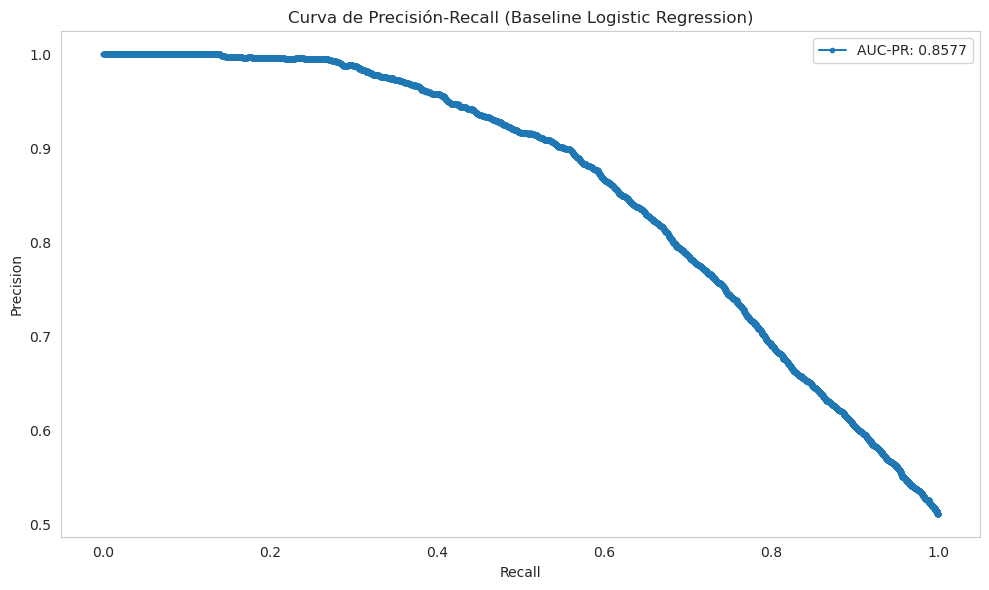

In [61]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, average_precision_score, precision_recall_curve
import matplotlib.pyplot as plt

# Modelo baseline
baseline_model = LogisticRegression(max_iter=1000, random_state=42)

# Entrenar el modelo con X_train e y_train
baseline_model.fit(X_train, y_train)

# Predecir en el conjunto de prueba
y_pred = baseline_model.predict(X_test)
y_proba = baseline_model.predict_proba(X_test)[:, 1]

# Evaluar el modelo
print("Evaluación del Modelo Baseline (Logistic Regression):")
print(classification_report(y_test, y_pred))

# Calcular y mostrar AUC-PR
auc_pr = average_precision_score(y_test, y_proba)
print(f"AUC-PR: {auc_pr:.4f}")

# Graficar la curva de Precisión-Recall
precision, recall, _ = precision_recall_curve(y_test, y_proba)
plt.figure(figsize=(10, 6))
plt.plot(recall, precision, marker='.', label=f'AUC-PR: {auc_pr:.4f}')
plt.title('Curva de Precisión-Recall (Baseline Logistic Regression)')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()


Evaluando modelo: Random Forest
Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.93      0.89      6492
           1       0.92      0.84      0.88      6797

    accuracy                           0.88     13289
   macro avg       0.89      0.88      0.88     13289
weighted avg       0.89      0.88      0.88     13289

AUC-PR: 0.9602

Evaluando modelo: LightGBM
[LightGBM] [Info] Number of positive: 15859, number of negative: 15148
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001150 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2618
[LightGBM] [Info] Number of data points in the train set: 31007, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.511465 -> initscore=0.045869
[LightGBM] [Info] Start training from score 0.045869
Classification Rep

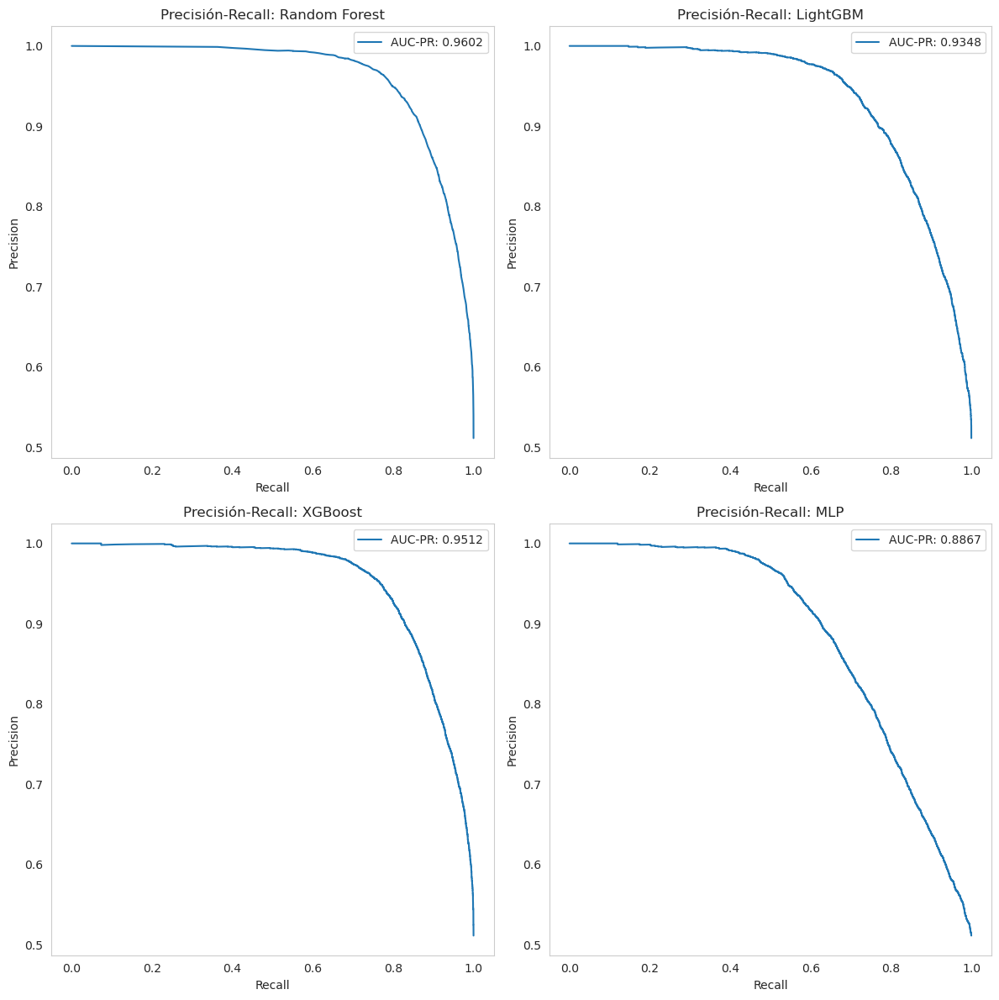

In [62]:
from sklearn.ensemble import RandomForestClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier

# Diccionario de modelos
models = {
    "Random Forest": RandomForestClassifier(random_state=42),
    "LightGBM": LGBMClassifier(random_state=42),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42),
    "MLP": MLPClassifier(random_state=42, max_iter=500)
}

# Almacenar resultados
results = {}

# Evaluar cada modelo
for model_name, model in models.items():
    print(f"\nEvaluando modelo: {model_name}")

    # Entrenar el modelo
    model.fit(X_train, y_train)

    # Predecir
    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test)[:, 1] if hasattr(model, "predict_proba") else None

    # Evaluar el modelo
    print("Classification Report:")
    print(classification_report(y_test, y_pred))

    # Calcular y guardar AUC-PR si las probabilidades están disponibles
    if y_proba is not None:
        auc_pr = average_precision_score(y_test, y_proba)
        print(f"AUC-PR: {auc_pr:.4f}")

        # Guardar precisión, recall y AUC-PR
        precision, recall, _ = precision_recall_curve(y_test, y_proba)
        results[model_name] = {
            'precision': precision,
            'recall': recall,
            'auc_pr': auc_pr
        }

# Graficar todas las curvas de Precisión-Recall en una figura
fig, axes = plt.subplots(2, 2, figsize=(12, 12))
axes = axes.ravel()

for idx, (model_name, result) in enumerate(results.items()):
    axes[idx].plot(result['recall'], result['precision'], label=f"AUC-PR: {result['auc_pr']:.4f}")
    axes[idx].set_title(f"Precisión-Recall: {model_name}")
    axes[idx].set_xlabel("Recall")
    axes[idx].set_ylabel("Precision")
    axes[idx].legend()
    axes[idx].grid()

plt.tight_layout()
plt.show()


> Random Forest es el mejor modelo para predecir la morosidad de una billetera debido a su desempeño superior en métricas clave. Con un **AUC-PR de 0.9602**, supera a los demás modelos, indicando su excelente capacidad para distinguir billeteras morosas incluso en contextos desbalanceados. Su **F1-Score ponderado de 0.88** muestra un equilibrio sólido entre precisión (92%) y recall (84%), minimizando errores críticos en ambas clases. Además, Random Forest maneja eficientemente relaciones no lineales y características correlacionadas, siendo más robusto y menos dependiente de preprocesamiento intensivo que otros modelos como LightGBM o MLP. Visualmente, su curva de precisión-recall destaca por mantener alta precisión incluso con valores altos de recall, consolidándose como la mejor opción para este problema.

# Interpretabilidad de RandomForest

Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.93      0.89      6492
           1       0.92      0.84      0.88      6797

    accuracy                           0.88     13289
   macro avg       0.89      0.88      0.88     13289
weighted avg       0.89      0.88      0.88     13289

AUC-PR: 0.9602


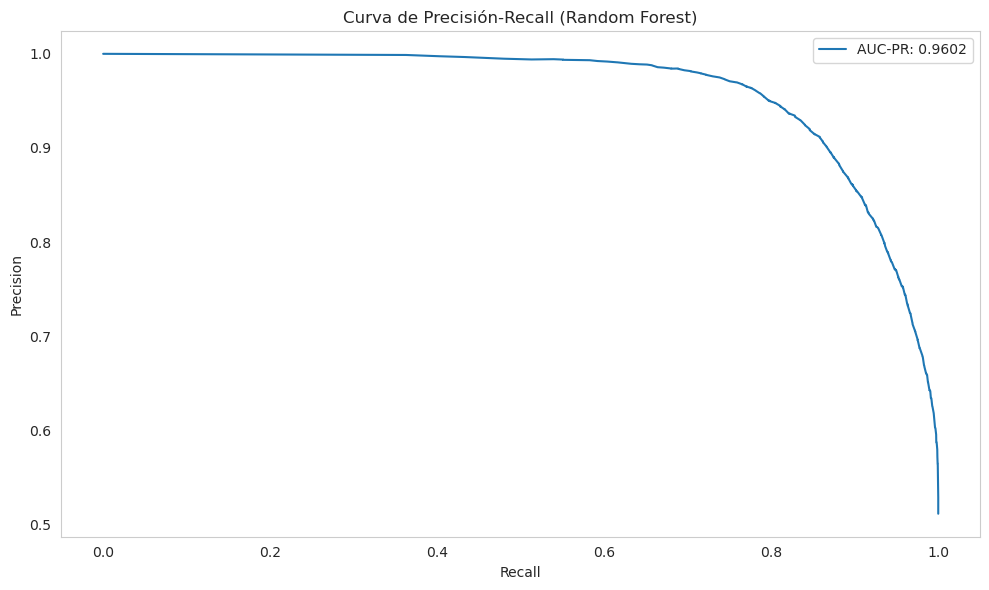

Características más importantes:
risk_factor: 0.1867
risk_factor_above_threshold_daily_count: 0.1072
avg_risk_factor: 0.1004
wallet_age_hours: 0.0892
outgoing_tx_avg_eth: 0.0818
avg_gas_paid_per_tx_eth: 0.0789
total_gas_paid_eth: 0.0776
max_eth_ever: 0.0767
net_incoming_tx_count: 0.0726
market_aroonosc: 0.0621
time_since_last_liquidated: 0.0407
cluster: 0.0203
unique_borrow_protocol_count: 0.0057


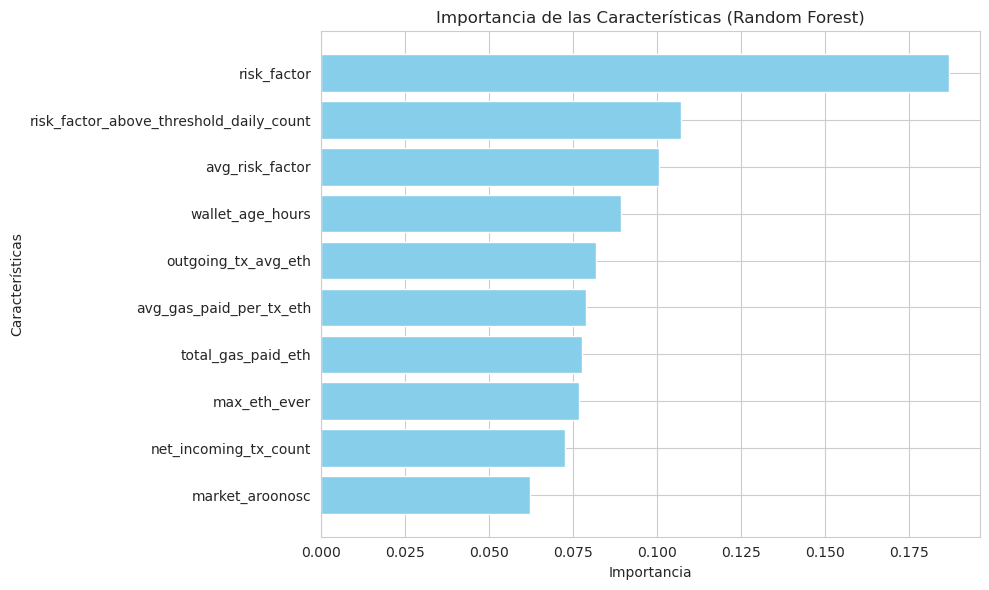

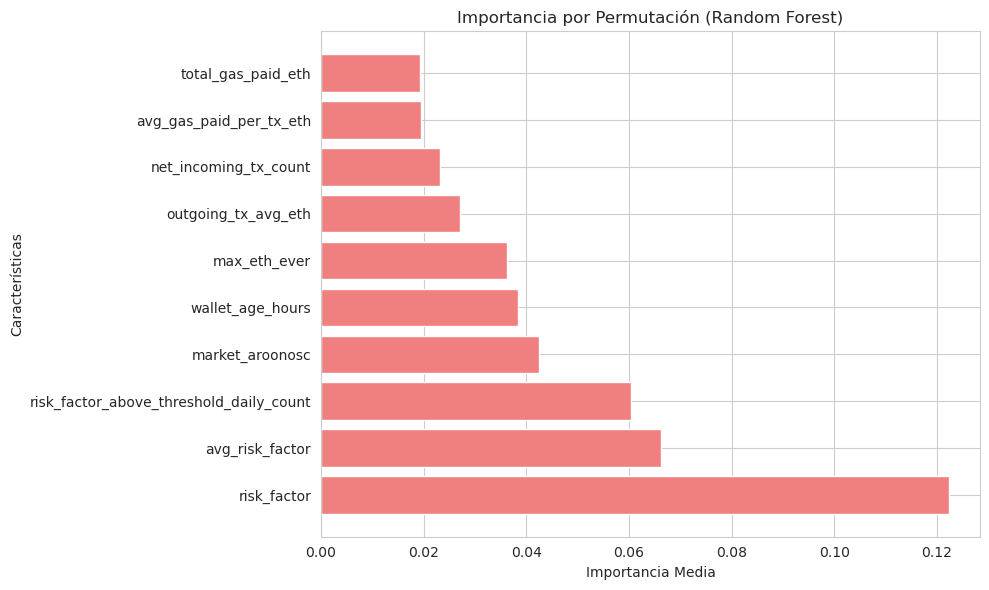

total_gas_paid_eth: 0.0192
avg_gas_paid_per_tx_eth: 0.0194
net_incoming_tx_count: 0.0232
outgoing_tx_avg_eth: 0.0272
max_eth_ever: 0.0362
wallet_age_hours: 0.0384
market_aroonosc: 0.0424
risk_factor_above_threshold_daily_count: 0.0603
avg_risk_factor: 0.0663
risk_factor: 0.1223


In [71]:
from sklearn.inspection import permutation_importance

# Modelo Random Forest
rf_model = RandomForestClassifier(random_state=42)

# Entrenar el modelo
rf_model.fit(X_train, y_train)

# Predecir
y_pred = rf_model.predict(X_test)
y_proba = rf_model.predict_proba(X_test)[:, 1]

# Evaluar el modelo
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Calcular y mostrar AUC-PR
auc_pr = average_precision_score(y_test, y_proba)
print(f"AUC-PR: {auc_pr:.4f}")

# Graficar la curva de Precisión-Recall
precision, recall, _ = precision_recall_curve(y_test, y_proba)
plt.figure(figsize=(10, 6))
plt.plot(recall, precision, label=f"AUC-PR: {auc_pr:.4f}")
plt.title("Curva de Precisión-Recall (Random Forest)")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

# Interpretar el modelo Random Forest
feature_importances = rf_model.feature_importances_
features = X_preprocessed_df.columns if hasattr(X, 'columns') else [f"Feature {i}" for i in range(X.shape[1])]

# Mostrar las características más importantes
importance_df = sorted(zip(features, feature_importances), key=lambda x: x[1], reverse=True)
print("Características más importantes:")
for feature, importance in importance_df:
    print(f"{feature}: {importance:.4f}")

# Graficar la importancia de las características
plt.figure(figsize=(10, 6))
plt.barh([x[0] for x in importance_df[:10]], [x[1] for x in importance_df[:10]], color='skyblue')
plt.title("Importancia de las Características (Random Forest)")
plt.xlabel("Importancia")
plt.ylabel("Características")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

# Permutación de importancia para validar
perm_importance = permutation_importance(rf_model, X_test, y_test, n_repeats=10, random_state=42)
perm_sorted_idx = perm_importance.importances_mean.argsort()[-10:]
plt.figure(figsize=(10, 6))
plt.barh([features[i] for i in perm_sorted_idx], perm_importance.importances_mean[perm_sorted_idx], color='lightcoral')
plt.title("Importancia por Permutación (Random Forest)")
plt.xlabel("Importancia Media")
plt.ylabel("Características")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

# Asegurar que las características se imprimen junto a los nombres
for idx in perm_sorted_idx:
    print(f"{features[idx]}: {perm_importance.importances_mean[idx]:.4f}")


>El modelo Random Forest predice la probabilidad de morosidad de las billeteras utilizando características clave relacionadas con el comportamiento transaccional y el nivel de riesgo. La variable más influyente es **`risk_factor`**, que representa el nivel general de riesgo asociado con la billetera y tiene una importancia del 18.67%. Este factor es crucial para identificar las billeteras con mayor probabilidad de morosidad. Además, el modelo utiliza **`risk_factor_above_threshold_daily_count`** (10.72%), que indica la frecuencia con la que el factor de riesgo supera un umbral crítico, y **`avg_risk_factor`** (10.04%), que refleja el promedio del riesgo durante un periodo. Estas variables proporcionan una visión clara del comportamiento de riesgo acumulado de la billetera.
>
>Otras características, como **`wallet_age_hours`** (8.92%) y **`outgoing_tx_avg_eth`** (8.18%), contribuyen significativamente al modelo. Estas representan, respectivamente, la antigüedad de la billetera en horas y el promedio de transacciones salientes en Ethereum. Estas variables permiten al modelo capturar patrones de comportamiento a largo plazo y transacciones anómalas que podrían estar asociadas con morosidad. En conjunto, el modelo utiliza estas características para realizar predicciones robustas, identificando billeteras de alto riesgo con alta precisión y recall.

In [82]:
import joblib

# Guardar el mejor modelo de la etapa 1
joblib.dump(rf_model, 'models/rf_base.pkl')

['rf_base.pkl']

# Optimización de hiperparametros (RandomForest)


In [79]:
import optuna
from sklearn.model_selection import  cross_val_score
from sklearn.metrics import average_precision_score, make_scorer

# Definir la función objetivo para Optuna
def objective(trial):
    # Hiperparámetros del modelo
    n_estimators = trial.suggest_int("n_estimators", 50, 500)
    max_depth = trial.suggest_int("max_depth", 5, 50)
    min_samples_split = trial.suggest_int("min_samples_split", 2, 20)
    min_samples_leaf = trial.suggest_int("min_samples_leaf", 1, 10)
    max_features = trial.suggest_categorical("max_features", ["sqrt", "log2", None])

    rf_model = RandomForestClassifier(
            n_estimators=n_estimators,
            max_depth=max_depth,
            min_samples_split=min_samples_split,
            min_samples_leaf=min_samples_leaf,
            max_features=max_features,
            random_state=42
        )

    # Validación cruzada con la métrica de AUC-PR
    auc_pr_scorer = make_scorer(average_precision_score, needs_proba=True)
    scores = cross_val_score(rf_model, X_train, y_train, cv=3, scoring=auc_pr_scorer)
    return scores.mean()

# Iniciar el estudio de Optuna
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=50)

# Mostrar los mejores hiperparámetros
print("Mejores hiperparámetros:", study.best_params)
print("Mejor AUC-PR:", study.best_value)

[I 2024-12-11 19:32:22,392] A new study created in memory with name: no-name-95016722-6af4-4776-b16f-1e2236aaa64c
[I 2024-12-11 19:33:54,221] Trial 0 finished with value: 0.9282601307715801 and parameters: {'n_estimators': 184, 'max_depth': 29, 'min_samples_split': 9, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.9282601307715801.
[I 2024-12-11 19:34:20,590] Trial 1 finished with value: 0.9031809990198388 and parameters: {'n_estimators': 286, 'max_depth': 8, 'min_samples_split': 6, 'min_samples_leaf': 7, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9282601307715801.
[I 2024-12-11 19:34:47,367] Trial 2 finished with value: 0.9135881357776992 and parameters: {'n_estimators': 62, 'max_depth': 10, 'min_samples_split': 6, 'min_samples_leaf': 10, 'max_features': None}. Best is trial 0 with value: 0.9282601307715801.
[I 2024-12-11 19:35:55,582] Trial 3 finished with value: 0.9335098616433553 and parameters: {'n_estimators': 396, 'max_depth': 35, 'min_s

Mejores hiperparámetros: {'n_estimators': 308, 'max_depth': 38, 'min_samples_split': 7, 'min_samples_leaf': 1, 'max_features': 'log2'}
Mejor AUC-PR: 0.9466541727704434


> Se decide optimizar bajo la métrica de AUC-PR, ya que esta métrica engloba el comportamiento deseado en relación al objetivo del modelo.

In [4]:
from sklearn.ensemble import RandomForestClassifier
rf_model = RandomForestClassifier(
    n_estimators=308,
    max_depth=38,
    min_samples_split=7,
    min_samples_leaf=1,
    max_features='log2'
)
rf_model.fit(X_train, y_train)

/home/crisu/miniconda3/envs/proyecto/lib/python3.9/site-packages/sklearn/base.py:1389: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


RandomForestClassifier(max_depth=38, max_features='log2', min_samples_split=7,
                       n_estimators=308)

In [5]:

# Guardar el mejor modelo
import joblib

# Guardar el mejor modelo de la etapa 1
joblib.dump(rf_model, 'models/rf_optimized.pkl')

['models/rf_optimized.pkl']

In [85]:
import optuna.visualization as vis

# Gráfico del historial de optimización
optimization_history = vis.plot_optimization_history(study)
optimization_history.show()

> Se optimizaron los hiperparametros por alrededor de hora y media, el resultado en la metrica objetio ya es bsatante bueno, por lo que un mayor tiempo de entrenamiento muy probablemente solo incremente en un valor infimo la metrica.

In [87]:
# Gráfico de coordenadas paralelas
parallel_coordinates = vis.plot_parallel_coordinate(study)
parallel_coordinates.show()

In [89]:
# Gráfico de importancia de hiperparámetros
param_importance = vis.plot_param_importances(study)
param_importance.show()

> EL hiperparametro más importante es **max_depth**.

# Interpretabilidad en las predicciones

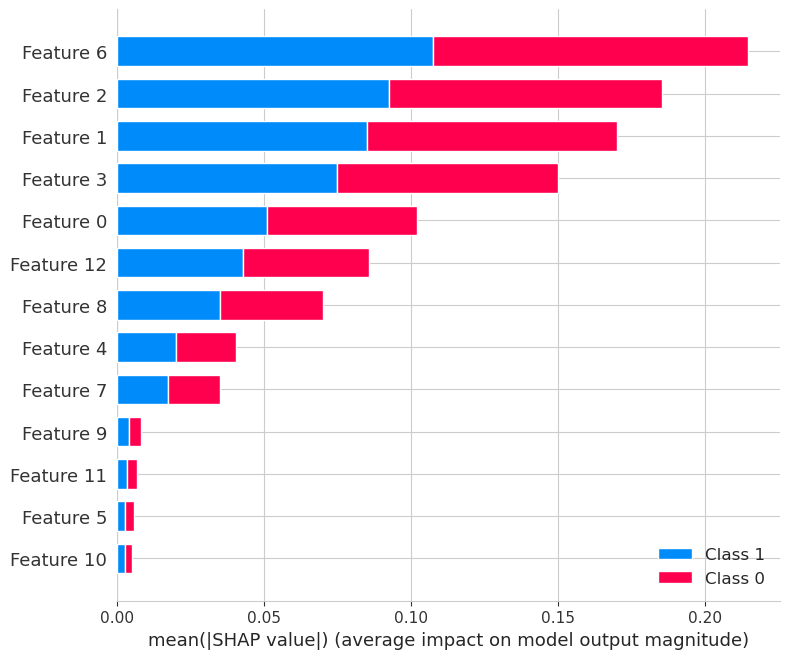

AttributeError: module 'shap.utils' has no attribute 'most_important'

In [4]:
import shap
import joblib

rf_model = joblib.load('models/rf_optimized.pkl')
# Interpretación con SHAP
def analisis_shap(modelo, X_test):
    # Explicador SHAP
    explicador = shap.TreeExplainer(modelo)  # Cambio de TreeExplicador a TreeExplainer
    shap_values = explicador.shap_values(X_test)

    # Resumen de valores SHAP
    shap.summary_plot(shap_values, X_test)

    # Gráfico de dependencia para la característica más importante
    # Modificación para versiones recientes de SHAP
    shap.dependence_plot(
        shap.utils.most_important(shap_values),  # Cambio en la selección de característica más importante
        shap_values,
        X_test
    )

analisis_shap(rf_model, X_test[:2])

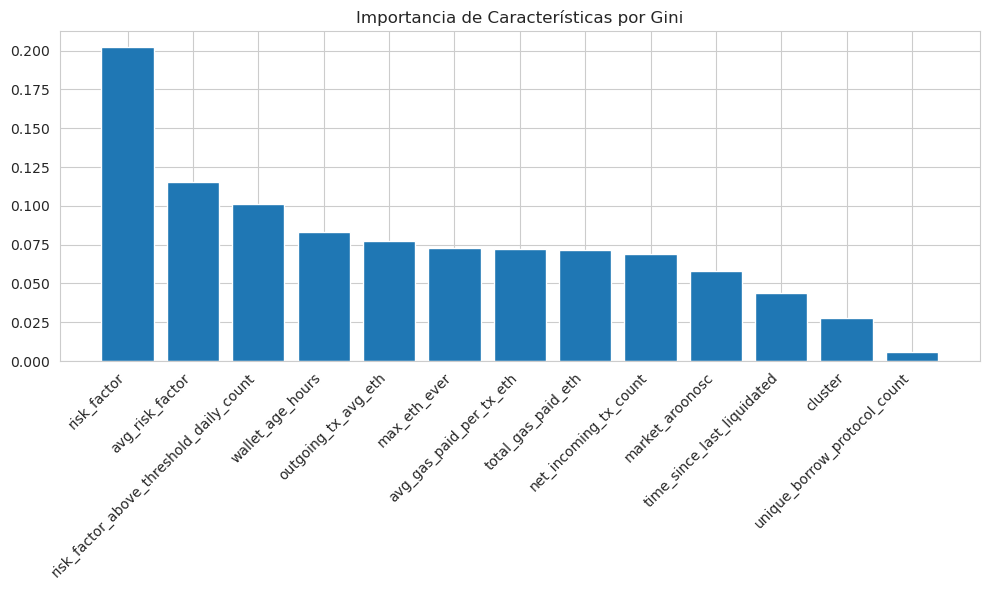

 1) risk_factor                    0.202252
 2) avg_risk_factor                0.115217
 3) risk_factor_above_threshold_daily_count 0.101151
 4) wallet_age_hours               0.083083
 5) outgoing_tx_avg_eth            0.077138
 6) max_eth_ever                   0.073119
 7) avg_gas_paid_per_tx_eth        0.071947
 8) total_gas_paid_eth             0.071444
 9) net_incoming_tx_count          0.069164
10) market_aroonosc                0.058217
11) time_since_last_liquidated     0.043652
12) cluster                        0.027882
13) unique_borrow_protocol_count   0.005732


In [9]:
def plot_feature_importance(rf_model, feature_names):
    # Importancia por GINI (equivalente a 'weight')
    plt.figure(figsize=(10, 6))
    importances = rf_model.feature_importances_
    indices = np.argsort(importances)[::-1]

    plt.title('Importancia de Características por Gini')
    plt.bar(range(len(importances)), importances[indices])
    plt.xticks(range(len(importances)),
               [feature_names[i] for i in indices],
               rotation=45,
               ha='right')
    plt.tight_layout()
    plt.show()

    # Análisis detallado de importancias
    for f in range(len(feature_names)):
        print("%2d) %-*s %f" % (f + 1, 30,
              feature_names[indices[f]],
              importances[indices[f]]))

plot_feature_importance(rf_model, X_preprocessed_df.columns)


In [35]:
import lime
import lime.lime_tabular
import numpy as np

# Crear explicador LIME
explicador_lime = lime.lime_tabular.LimeTabularExplainer(
    X_train.values,
    feature_names=X_train.columns,
    class_names=rf_model.classes_
)

indices = np.random.choice(4000, size=3, replace=False)

# Explicar cada instancia y visualizar
for indice in indices:
    instancia = X_test.iloc[indice]
    explicacion_lime = explicador_lime.explain_instance(
        instancia.values,
        rf_model.predict_proba,
        num_features=10
    )
    print(f"Explicación para la instancia {indice}:")
    explicacion_lime.show_in_notebook()

Explicación para la instancia 770:


Explicación para la instancia 3332:


Explicación para la instancia 456:


> Existe un claro sesgo con el factor de riesgo, donde personas con riesgo alto tienden a ser clasificadas como posibles billeteras morosas. Tal como se muestra en las tres predicciones, las variables relacionadas con el riesgo tienen un peso claramente más importante que el resto.

## Función para re-entrenamiento del modelo

In [8]:
from sklearn.model_selection import train_test_split
import joblib
from sklearn.metrics import accuracy_score, classification_report, average_precision_score


def actualizar_modelo_rf(modelo, nuevos_datos, preprocessor):
    """
    Actualiza el modelo Random Forest reentrenándolo con nuevos datos.
    """
    # Transformar los datos con el preprocesador existente
    X_new = preprocessor.transform(nuevos_datos.drop(columns=["target"]))
    y_new = nuevos_datos["target"]

    # Dividir los nuevos datos en entrenamiento y prueba
    X_train_new, X_test_new, y_train_new, y_test_new = train_test_split(
        X_new, y_new, train_size=0.7, stratify=y_new, random_state=42
    )

    # Reentrenar el modelo completamente con los datos nuevos
    modelo.fit(X_train_new, y_train_new)
    
    # Predicciones
    y_pred = modelo.predict(X_test_new)
    y_pred_proba = modelo.predict_proba(X_test_new)[:, 1]
    # Evaluar el modelo con los datos nuevos
   # Calcular métricas
    accuracy = accuracy_score(y_test_new, y_pred)
    auc_pr = average_precision_score(y_test_new, y_pred_proba)
    classification_rep = classification_report(y_test_new, y_pred)

    # Imprimir resultados
    print(f"Accuracy del modelo actualizado: {accuracy:.4f}")
    print(f"AUC-PR del modelo actualizado: {auc_pr:.4f}")
    print("Reporte de Clasificación:")
    print(classification_rep)

    return modelo

# Leer los DataFrames
X_0 = pd.read_parquet("../data/raw/X_t0.parquet")
X_1 = pd.read_parquet("../data/raw/X_t1.parquet")
y_0 = pd.read_parquet("../data/raw/y_t0.parquet")
y_1 = pd.read_parquet("../data/raw/y_t1.parquet")

# Concatenar datos antiguos y nuevos
X = pd.concat([X_0, X_1], axis=0).reset_index(drop=True)
y = pd.concat([y_0, y_1], axis=0).reset_index(drop=True)
df_new = pd.concat([X, y], axis=1)

# Cargar el modelo y preprocesador guardados
rf_model = joblib.load('models/rf_optimized.pkl')
preprocessor = joblib.load('models/preprocessor.pkl')

# Actualizar el modelo con los nuevos datos
rf_model = actualizar_modelo_rf(rf_model, df_new, preprocessor)

# Guardar el modelo actualizado
joblib.dump(rf_model, 'models/rf_updated.pkl')

Accuracy del modelo actualizado: 0.8697
AUC-PR del modelo actualizado: 0.9263
Reporte de Clasificación:
              precision    recall  f1-score   support

           0       0.85      0.95      0.90     31286
           1       0.91      0.75      0.83     21870

    accuracy                           0.87     53156
   macro avg       0.88      0.85      0.86     53156
weighted avg       0.87      0.87      0.87     53156



['models/rf_updated.pkl']

In [83]:
import optuna
from sklearn.ensemble import RandomForestClassifier
import optuna
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
import joblib
from sklearn.metrics import average_precision_score, make_scorer, classification_report

# Optimización con Optuna
def optimizar_rf(nuevos_datos, preprocessor):
    """
    Optimiza el modelo Random Forest utilizando Optuna.
    """
    def objective(trial):
        # Hiperparámetros del modelo
        n_estimators = trial.suggest_int("n_estimators", 50, 500)
        max_depth = trial.suggest_int("max_depth", 10, 50)
        min_samples_split = trial.suggest_int("min_samples_split", 2, 20)
        min_samples_leaf = trial.suggest_int("min_samples_leaf", 1, 10)
        max_features = trial.suggest_categorical("max_features", ["sqrt", "log2", None])

        # Transformar los datos
        X_new = preprocessor.transform(nuevos_datos.drop(columns=["target"]))
        y_new = nuevos_datos["target"]

        # Dividir los datos en entrenamiento y prueba
        X_train_new, X_test_new, y_train_new, y_test_new = train_test_split(
            X_new, y_new, train_size=0.7, stratify=y_new, random_state=42
        )

        # Crear y entrenar el modelo
        rf_model = RandomForestClassifier(
            n_estimators=n_estimators,
            max_depth=max_depth,
            min_samples_split=min_samples_split,
            min_samples_leaf=min_samples_leaf,
            max_features=max_features,
            random_state=42
        )
        rf_model.fit(X_train_new, y_train_new)

        # Evaluar con AUC-PR
        y_pred_proba = rf_model.predict_proba(X_test_new)[:, 1]
        auc_pr = average_precision_score(y_test_new, y_pred_proba)
        return auc_pr

    # Ejecutar la optimización
    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=2)

    print("Mejores hiperparámetros:", study.best_params)

    # Crear el modelo optimizado
    best_params = study.best_params
    rf_model = RandomForestClassifier(
        n_estimators=best_params["n_estimators"],
        max_depth=best_params["max_depth"],
        min_samples_split=best_params["min_samples_split"],
        min_samples_leaf=best_params["min_samples_leaf"],
        max_features=best_params["max_features"],
        random_state=42
    )

    # Entrenar el modelo optimizado con todos los datos nuevos
    X_all_new = preprocessor.transform(nuevos_datos.drop(columns=["target"]))
    y_all_new = nuevos_datos["target"]
    rf_model.fit(X_all_new, y_all_new)

    # Guardar el modelo optimizado
    joblib.dump(rf_model, "models/rf_optimized_updated.pkl")
    print("Modelo optimizado guardado como 'rf_optimized_updated.pkl'")
    return rf_model

rf_optimized = optimizar_rf(df_new, preprocessor)


[I 2024-12-12 00:30:07,922] A new study created in memory with name: no-name-623b3552-24e1-4612-8e7b-9fc46572cb77
[I 2024-12-12 00:31:23,685] Trial 0 finished with value: 0.9124378297667716 and parameters: {'n_estimators': 175, 'max_depth': 50, 'min_samples_split': 14, 'min_samples_leaf': 5, 'max_features': 'log2'}. Best is trial 0 with value: 0.9124378297667716.
[I 2024-12-12 00:33:53,911] Trial 1 finished with value: 0.9163204637465993 and parameters: {'n_estimators': 351, 'max_depth': 24, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9163204637465993.
[I 2024-12-12 00:34:18,516] Trial 2 finished with value: 0.84546114986304 and parameters: {'n_estimators': 102, 'max_depth': 7, 'min_samples_split': 11, 'min_samples_leaf': 5, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.9163204637465993.
[I 2024-12-12 00:36:29,340] Trial 3 finished with value: 0.9122493787219528 and parameters: {'n_estimators': 308, 'max_depth': 22, 'm

Mejores hiperparámetros: {'n_estimators': 351, 'max_depth': 24, 'min_samples_split': 13, 'min_samples_leaf': 2, 'max_features': 'sqrt'}
Modelo optimizado guardado como 'rf_optimized_updated.pkl'


# Tracking con MLflow

In [ ]:
# Guardar el modelo actualizado
rf_model_act_optimized = RandomForestClassifier(
    n_estimators=351,
    max_features='sqrt',
    max_depth=24,
    min_samples_split=13,
    min_samples_leaf=2
)


joblib.dump(rf_model_act_optimized, 'models/rf_updated.pkl')

In [84]:
import mlflow
import mlflow.sklearn
from sklearn.metrics import accuracy_score, classification_report, average_precision_score
import joblib

def track_model_with_mlflow(model, X_train, X_test, y_train, y_test, params, preprocessor, model_name="RandomForest"):
    """
    Rastrear el entrenamiento, evaluación y guardado de un modelo con MLflow.
    """
    # Iniciar el experimento
    mlflow.set_experiment("Modelo con nuevos datos")

    with mlflow.start_run():
        # Log de hiperparámetros
        for param, value in params.items():
            mlflow.log_param(param, value)

        # Entrenar el modelo
        model.fit(X_train, y_train)

        # Evaluar el modelo
        y_pred = model.predict(X_test)
        y_pred_proba = model.predict_proba(X_test)[:, 1]

        accuracy = accuracy_score(y_test, y_pred)
        auc_pr = average_precision_score(y_test, y_pred_proba)
        mlflow.log_metric("accuracy", accuracy)
        mlflow.log_metric("auc_pr", auc_pr)

        # Log del modelo
        mlflow.sklearn.log_model(model, model_name)

        # Guardar el modelo localmente
        joblib.dump(model, f"models/{model_name}_tracked.pkl")
        print(f"Modelo guardado localmente: models/{model_name}_tracked.pkl")

        # Log de otros artefactos
        mlflow.log_artifact("models/preprocessor.pkl")  # Guardar el preprocesador si es relevante

        print(f"Accuracy: {accuracy:.4f}, AUC-PR: {auc_pr:.4f}")


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

# Supongamos que `nuevos_datos` contiene los datos procesados
X_new = preprocessor.transform(nuevos_datos.drop(columns=["target"]))
y_new = nuevos_datos["target"]

# Dividir datos
X_train, X_test, y_train, y_test = train_test_split(X_new, y_new, test_size=0.3, stratify=y_new, random_state=42)

# Parámetros del modelo
rf_params = {
    "n_estimators": 200,
    "max_depth": 20,
    "min_samples_split": 5,
    "min_samples_leaf": 2,
    "max_features": "sqrt"
}

# Modelo
rf_model = RandomForestClassifier(**rf_params, random_state=42)

# Tracking con MLflow
track_model_with_mlflow(rf_model, X_train, X_test, y_train, y_test, rf_params, preprocessor, model_name="RandomForest")


In [ ]:
# Importancia de características
import pandas as pd

def log_feature_importance(model, feature_names):
    importance = model.feature_importances_
    feature_df = pd.DataFrame({"Feature": feature_names, "Importance": importance})
    feature_df = feature_df.sort_values(by="Importance", ascending=False)

    # Guardar como CSV
    feature_df.to_csv("models/feature_importance.csv", index=False)
    print("Importancia de características guardada.")

    # Log en MLflow
    mlflow.log_artifact("models/feature_importance.csv")


# Gradio y FastAPI

## API con FastAPI

In [13]:
from fastapi import FastAPI, UploadFile, Form
from pydantic import BaseModel
import pandas as pd
import joblib
from typing import Optional, Dict, Any
import numpy as np

from sklearn.cluster import KMeans
from sklearn.base import BaseEstimator, TransformerMixin
# Custom Transformer para procesar timestamps y crear 'wallet_age_hours'
class WalletAgeTransformer(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X = X.copy()
        X['last_tx_timestamp'] = pd.to_datetime(X['last_tx_timestamp'])
        X['first_tx_timestamp'] = pd.to_datetime(X['first_tx_timestamp'])
        X['wallet_age_hours'] = (X['last_tx_timestamp'] - X['first_tx_timestamp']).dt.total_seconds() / 360
        return X

# Custom Transformer para agregar clusters
class ClusterAdder(BaseEstimator, TransformerMixin):
    def __init__(self, n_clusters=4, random_state=42):
        self.kmeans = KMeans(n_clusters=n_clusters, random_state=random_state)

    def fit(self, X, y=None):
        self.kmeans.fit(X)
        return self

    def transform(self, X):
        X = X.copy()
        clusters = self.kmeans.predict(X)
        return np.hstack((X, clusters.reshape(-1, 1)))

# Crear la app FastAPI
app = FastAPI()

# Cargar el modelo y el preprocesador
try:
    preprocessor = joblib.load("../notebooks/models/preprocessor.pkl")
    model = joblib.load("../notebooks/models/rf_updated.pkl")
except Exception as e:
    raise RuntimeError(f"Error al cargar modelo o preprocesador: {str(e)}")

class PredictionInput(BaseModel):
    last_tx_timestamp: int  # Los timestamps se envían como strings en formato ISO 8601
    first_tx_timestamp: int
    wallet_age_hours: float
    risk_factor: float
    avg_risk_factor: float
    time_since_last_liquidated: float
    market_aroonosc: float
    unique_borrow_protocol_count: int
    risk_factor_above_threshold_daily_count: int
    outgoing_tx_avg_eth: float
    max_eth_ever: float
    total_gas_paid_eth: float
    avg_gas_paid_per_tx_eth: float
    net_incoming_tx_count: int

# Ruta para predicciones por archivo .csv
@app.post("/predict_csv/")
async def predict_csv(file: UploadFile):
    try:
        # Leer el archivo CSV subido
        df = pd.read_csv(file.file)

        # Aplicar el preprocesador a los datos
        X = preprocessor.transform(df)

        # Realizar las predicciones y calcular las probabilidades
        predictions = model.predict(X)
        probabilities = model.predict_proba(X)[:, 1]

        # Combinar los resultados en una lista de diccionarios
        results = [
            {"prediction": int(pred), "probability": float(prob)}
            for pred, prob in zip(predictions, probabilities)
        ]

        return {"predictions": results}

    except Exception as e:
        # Manejar cualquier error que ocurra en el flujo
        return {"error": f"Error durante la predicción: {str(e)}"}



# Ruta para predicciones manuales
@app.post("/predict_manual/")
async def predict_manual(input_data: PredictionInput):
    try:
        # Convertir el modelo de entrada a un DataFrame
        input_dict = input_data.dict()
        df = pd.DataFrame([input_dict])

        # Aplicar el preprocesador
        X = preprocessor.transform(df)

        # Realizar la predicción
        prediction = int(model.predict(X)[0])  # Convertir a entero
        probability = float(model.predict_proba(X)[:, 1][0])  # Convertir a flotante

        return {"prediction": prediction, "probability": probability}

    except Exception as e:
        import traceback
        error_details = traceback.format_exc()
        return {
            "error": f"Error durante la predicción: {str(e)}",
            "details": error_details
        }



# Para iniciar el host de la api
#if __name__ == "__main__":
 #   import uvicorn
  #  uvicorn.run(app, host="0.0.0.0", port=8000)

## Aplicación con gradio

In [14]:
import gradio as gr
import requests

# Ruta del backend
BACKEND_URL = "http://localhost:8000/"

# Función para predicción por archivo
def predict_csv(file_path):
    try:
        with open(file_path.name, 'rb') as f:
            response = requests.post(f"{BACKEND_URL}/predict_csv/", files={"file": f})

        print("Respuesta del servidor:", response.status_code, response.text)  # Depuración

        # Verificar el estado de la respuesta
        response.raise_for_status()

        # Intentar decodificar el JSON
        return response.json()
    except requests.exceptions.RequestException as e:
        return {"error": f"Error al realizar la solicitud: {str(e)}"}
    except requests.exceptions.JSONDecodeError:
        return {"error": "El servidor no devolvió una respuesta JSON válida."}


import requests

def predict_manual(*args):
    # Número esperado de argumentos
    expected_args = 13

    # Verificar que se proporcionen los argumentos necesarios
    if len(args) < expected_args:
        return {"error": f"Se esperaban {expected_args} argumentos, pero se recibieron {len(args)}"}

    # Construir los datos de entrada para la API
    input_data = {
        "last_tx_timestamp": args[0],  # Asumiendo que es un timestamp en formato ISO 8601
        "first_tx_timestamp": args[1],
        "wallet_age_hours": args[2],
        "risk_factor": args[3],
        "avg_risk_factor": args[4],
        "time_since_last_liquidated": args[5],
        "market_aroonosc": args[6],
        "unique_borrow_protocol_count": args[7],
        "risk_factor_above_threshold_daily_count": args[8],
        "outgoing_tx_avg_eth": args[9],
        "max_eth_ever": args[10],
        "total_gas_paid_eth": args[11],
        "avg_gas_paid_per_tx_eth": args[12],
        "net_incoming_tx_count": args[13],
    }

    # Realizar la solicitud POST a la API
    try:
        response = requests.post(f"{BACKEND_URL}/predict_manual/", json=input_data)
        response.raise_for_status()  # Genera una excepción si el código de estado HTTP indica un error
        return response.json()  # Retorna el JSON de la respuesta
    except requests.exceptions.RequestException as e:
        return {"error": f"Error al realizar la solicitud: {str(e)}"}



# Interfaz Gradio
with gr.Blocks() as demo:
    gr.Markdown("### Predicción de Probabilidad de Morosidad")

    # Tab para cargar archivo CSV
    with gr.Tab("Cargar Archivo CSV"):
        file_input = gr.File(label="Sube tu archivo CSV")
        csv_output = gr.Textbox(label="Resultados del CSV")
        file_btn = gr.Button("Predecir desde CSV")
        file_btn.click(predict_csv, inputs=file_input, outputs=csv_output)

    # Tab para ingreso manual
    with gr.Tab("Ingreso Manual"):
        inputs = [
            gr.Textbox(label="Last Transaction Timestamp", placeholder="2023-01-01T12:34:56"),
            gr.Textbox(label="First Transaction Timestamp", placeholder="2023-01-01T10:30:00"),
            gr.Number(label="Wallet Age (Horas)"),
            gr.Number(label="Risk Factor"),
            gr.Number(label="Average Risk Factor"),
            gr.Number(label="Time Since Last Liquidated"),
            gr.Number(label="Market Aroonosc"),
            gr.Number(label="Unique Borrow Protocol Count"),
            gr.Number(label="Risk Factor Above Threshold Daily Count"),
            gr.Number(label="Outgoing TX Average ETH"),
            gr.Number(label="Max ETH Ever"),
            gr.Number(label="Total Gas Paid ETH"),
            gr.Number(label="Average Gas Paid Per TX ETH"),
            gr.Number(label="Net Incoming TX Count"),
        ]
        manual_output = gr.Textbox(label="Predicción y Probabilidad")
        manual_btn = gr.Button("Predecir")
        manual_btn.click(predict_manual, inputs=inputs, outputs=manual_output)


# Ejecutar la aplicación Gradio
#demo.launch()

/home/crisu/miniconda3/envs/proyecto/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


> A continuación se muestra el forntend diseñado con gradio en funcionamiento llamando a la API creada con FASTAPI
![](imagenes/gradio_csv.png)
![](imagenes/gradio_manual.png)

# Pipeline productivo usando Airflow